# Preprocessing Data

### Importing Libraries

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
plt.style.use('seaborn')

### Importing the Dataset

In [2]:
loan_data = pd.read_csv('loan_data.csv') 

C:\Users\m10sa\anaconda3\lib\site-packages\IPython\core\interactiveshell.py:3165: DtypeWarning: Columns (20) have mixed types.Specify dtype option on import or set low_memory=False.
  has_raised = await self.run_ast_nodes(code_ast.body, cell_name,


In [3]:
df = loan_data.copy()

### Exploratory Data Analysis and Data Cleansing

In [4]:
df.head()

,Unnamed: 0,id,member_id,loan_amnt,funded_amnt,funded_amnt_inv,term,int_rate,installment,grade,...,total_bal_il,il_util,open_rv_12m,open_rv_24m,max_bal_bc,all_util,total_rev_hi_lim,inq_fi,total_cu_tl,inq_last_12m
0,0,1077501,1296599,5000,5000,4975.0,36 months,10.65,162.87,B,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,1,1077430,1314167,2500,2500,2500.0,60 months,15.27,59.83,C,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,2,1077175,1313524,2400,2400,2400.0,36 months,15.96,84.33,C,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,3,1076863,1277178,10000,10000,10000.0,36 months,13.49,339.31,C,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,4,1075358,1311748,3000,3000,3000.0,60 months,12.69,67.79,B,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [5]:
df.columns

Index(['Unnamed: 0', 'id', 'member_id', 'loan_amnt', 'funded_amnt',
       'funded_amnt_inv', 'term', 'int_rate', 'installment', 'grade',
       'sub_grade', 'emp_title', 'emp_length', 'home_ownership', 'annual_inc',
       'verification_status', 'issue_d', 'loan_status', 'pymnt_plan', 'url',
       'desc', 'purpose', 'title', 'zip_code', 'addr_state', 'dti',
       'delinq_2yrs', 'earliest_cr_line', 'inq_last_6mths',
       'mths_since_last_delinq', 'mths_since_last_record', 'open_acc',
       'pub_rec', 'revol_bal', 'revol_util', 'total_acc',
       'initial_list_status', 'out_prncp', 'out_prncp_inv', 'total_pymnt',
       'total_pymnt_inv', 'total_rec_prncp', 'total_rec_int',
       'total_rec_late_fee', 'recoveries', 'collection_recovery_fee',
       'last_pymnt_d', 'last_pymnt_amnt', 'next_pymnt_d', 'last_credit_pull_d',
       'collections_12_mths_ex_med', 'mths_since_last_major_derog',
       'policy_code', 'application_type', 'annual_inc_joint', 'dti_joint',
       'verificatio

In [6]:
len(df.columns)

75

In [7]:
pd.set_option('display.max_columns', None)

In [8]:
df.head()               

,Unnamed: 0,id,member_id,loan_amnt,funded_amnt,funded_amnt_inv,term,int_rate,installment,grade,sub_grade,emp_title,emp_length,home_ownership,annual_inc,verification_status,issue_d,loan_status,pymnt_plan,url,desc,purpose,title,zip_code,addr_state,dti,delinq_2yrs,earliest_cr_line,inq_last_6mths,mths_since_last_delinq,mths_since_last_record,open_acc,pub_rec,revol_bal,revol_util,total_acc,initial_list_status,out_prncp,out_prncp_inv,total_pymnt,total_pymnt_inv,total_rec_prncp,total_rec_int,total_rec_late_fee,recoveries,collection_recovery_fee,last_pymnt_d,last_pymnt_amnt,next_pymnt_d,last_credit_pull_d,collections_12_mths_ex_med,mths_since_last_major_derog,policy_code,application_type,annual_inc_joint,dti_joint,verification_status_joint,acc_now_delinq,tot_coll_amt,tot_cur_bal,open_acc_6m,open_il_6m,open_il_12m,open_il_24m,mths_since_rcnt_il,total_bal_il,il_util,open_rv_12m,open_rv_24m,max_bal_bc,all_util,total_rev_hi_lim,inq_fi,total_cu_tl,inq_last_12m
0,0,1077501,1296599,5000,5000,4975.0,36 months,10.65,162.87,B,B2,NaN,10+ years,RENT,24000.0,Verified,Dec-11,Fully Paid,n,https://www.lendingclub.com/browse/loanDetail....,Borrower added on 12/22/11 > I need to upgra...,credit_card,Computer,860xx,AZ,27.65,0.0,Jan-85,1.0,NaN,NaN,3.0,0.0,13648,83.7,9.0,f,0.0,0.0,5861.071414,5831.78,5000.00,861.07,0.00,0.00,0.00,Jan-15,171.62,NaN,Jan-16,0.0,NaN,1,INDIVIDUAL,NaN,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,1,1077430,1314167,2500,2500,2500.0,60 months,15.27,59.83,C,C4,Ryder,< 1 year,RENT,30000.0,Source Verified,Dec-11,Charged Off,n,https://www.lendingclub.com/browse/loanDetail....,Borrower added on 12/22/11 > I plan to use t...,car,bike,309xx,GA,1.00,0.0,Apr-99,5.0,NaN,NaN,3.0,0.0,1687,9.4,4.0,f,0.0,0.0,1008.710000,1008.71,456.46,435.17,0.00,117.08,1.11,Apr-13,119.66,NaN,Sep-13,0.0,NaN,1,INDIVIDUAL,NaN,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,2,1077175,1313524,2400,2400,2400.0,36 months,15.96,84.33,C,C5,NaN,10+ years,RENT,12252.0,Not Verified,Dec-11,Fully Paid,n,https://www.lendingclub.com/browse/loanDetail....,NaN,small_business,real estate business,606xx,IL,8.72,0.0,Nov-01,2.0,NaN,NaN,2.0,0.0,2956,98.5,10.0,f,0.0,0.0,3003.653644,3003.65,2400.00,603.65,0.00,0.00,0.00,Jun-14,649.91,NaN,Jan-16,0.0,NaN,1,INDIVIDUAL,NaN,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,3,1076863,1277178,10000,10000,10000.0,36 months,13.49,339.31,C,C1,AIR RESOURCES BOARD,10+ years,RENT,49200.0,Source Verified,Dec-11,Fully Paid,n,https://www.lendingclub.com/browse/loanDetail....,Borrower added on 12/21/11 > to pay for prop...,other,personel,917xx,CA,20.00,0.0,Feb-96,1.0,35.0,NaN,10.0,0.0,5598,21.0,37.0,f,0.0,0.0,12226.302210,12226.30,10000.00,2209.33,16.97,0.00,0.00,Jan-15,357.48,NaN,Jan-15,0.0,NaN,1,INDIVIDUAL,NaN,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,4,1075358,1311748,3000,3000,3000.0,60 months,12.69,67.79,B,B5,University Medical Group,1 year,RENT,80000.0,Source Verified,Dec-11,Current,n,https://www.lendingclub.com/browse/loanDetail....,Borrower added on 12/21/11 > I plan on combi...,other,Personal,972xx,OR,17.94,0.0,Jan-96,0.0,38.0,NaN,15.0,0.0,27783,53.9,38.0,f,766.9,766.9,3242.170000,3242.17,2233.10,1009.07,0.00,0.00,0.00,Jan-16,67.79,Feb-16,Jan-16,0.0,NaN,1,INDIVIDUAL,NaN,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [9]:
df.drop(columns=['Unnamed: 0'], inplace=True)

In [10]:
df.head()

,id,member_id,loan_amnt,funded_amnt,funded_amnt_inv,term,int_rate,installment,grade,sub_grade,emp_title,emp_length,home_ownership,annual_inc,verification_status,issue_d,loan_status,pymnt_plan,url,desc,purpose,title,zip_code,addr_state,dti,delinq_2yrs,earliest_cr_line,inq_last_6mths,mths_since_last_delinq,mths_since_last_record,open_acc,pub_rec,revol_bal,revol_util,total_acc,initial_list_status,out_prncp,out_prncp_inv,total_pymnt,total_pymnt_inv,total_rec_prncp,total_rec_int,total_rec_late_fee,recoveries,collection_recovery_fee,last_pymnt_d,last_pymnt_amnt,next_pymnt_d,last_credit_pull_d,collections_12_mths_ex_med,mths_since_last_major_derog,policy_code,application_type,annual_inc_joint,dti_joint,verification_status_joint,acc_now_delinq,tot_coll_amt,tot_cur_bal,open_acc_6m,open_il_6m,open_il_12m,open_il_24m,mths_since_rcnt_il,total_bal_il,il_util,open_rv_12m,open_rv_24m,max_bal_bc,all_util,total_rev_hi_lim,inq_fi,total_cu_tl,inq_last_12m
0,1077501,1296599,5000,5000,4975.0,36 months,10.65,162.87,B,B2,NaN,10+ years,RENT,24000.0,Verified,Dec-11,Fully Paid,n,https://www.lendingclub.com/browse/loanDetail....,Borrower added on 12/22/11 > I need to upgra...,credit_card,Computer,860xx,AZ,27.65,0.0,Jan-85,1.0,NaN,NaN,3.0,0.0,13648,83.7,9.0,f,0.0,0.0,5861.071414,5831.78,5000.00,861.07,0.00,0.00,0.00,Jan-15,171.62,NaN,Jan-16,0.0,NaN,1,INDIVIDUAL,NaN,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,1077430,1314167,2500,2500,2500.0,60 months,15.27,59.83,C,C4,Ryder,< 1 year,RENT,30000.0,Source Verified,Dec-11,Charged Off,n,https://www.lendingclub.com/browse/loanDetail....,Borrower added on 12/22/11 > I plan to use t...,car,bike,309xx,GA,1.00,0.0,Apr-99,5.0,NaN,NaN,3.0,0.0,1687,9.4,4.0,f,0.0,0.0,1008.710000,1008.71,456.46,435.17,0.00,117.08,1.11,Apr-13,119.66,NaN,Sep-13,0.0,NaN,1,INDIVIDUAL,NaN,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,1077175,1313524,2400,2400,2400.0,36 months,15.96,84.33,C,C5,NaN,10+ years,RENT,12252.0,Not Verified,Dec-11,Fully Paid,n,https://www.lendingclub.com/browse/loanDetail....,NaN,small_business,real estate business,606xx,IL,8.72,0.0,Nov-01,2.0,NaN,NaN,2.0,0.0,2956,98.5,10.0,f,0.0,0.0,3003.653644,3003.65,2400.00,603.65,0.00,0.00,0.00,Jun-14,649.91,NaN,Jan-16,0.0,NaN,1,INDIVIDUAL,NaN,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,1076863,1277178,10000,10000,10000.0,36 months,13.49,339.31,C,C1,AIR RESOURCES BOARD,10+ years,RENT,49200.0,Source Verified,Dec-11,Fully Paid,n,https://www.lendingclub.com/browse/loanDetail....,Borrower added on 12/21/11 > to pay for prop...,other,personel,917xx,CA,20.00,0.0,Feb-96,1.0,35.0,NaN,10.0,0.0,5598,21.0,37.0,f,0.0,0.0,12226.302210,12226.30,10000.00,2209.33,16.97,0.00,0.00,Jan-15,357.48,NaN,Jan-15,0.0,NaN,1,INDIVIDUAL,NaN,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,1075358,1311748,3000,3000,3000.0,60 months,12.69,67.79,B,B5,University Medical Group,1 year,RENT,80000.0,Source Verified,Dec-11,Current,n,https://www.lendingclub.com/browse/loanDetail....,Borrower added on 12/21/11 > I plan on combi...,other,Personal,972xx,OR,17.94,0.0,Jan-96,0.0,38.0,NaN,15.0,0.0,27783,53.9,38.0,f,766.9,766.9,3242.170000,3242.17,2233.10,1009.07,0.00,0.00,0.00,Jan-16,67.79,Feb-16,Jan-16,0.0,NaN,1,INDIVIDUAL,NaN,NaN,NaN,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [11]:
df.tail()

,id,member_id,loan_amnt,funded_amnt,funded_amnt_inv,term,int_rate,installment,grade,sub_grade,emp_title,emp_length,home_ownership,annual_inc,verification_status,issue_d,loan_status,pymnt_plan,url,desc,purpose,title,zip_code,addr_state,dti,delinq_2yrs,earliest_cr_line,inq_last_6mths,mths_since_last_delinq,mths_since_last_record,open_acc,pub_rec,revol_bal,revol_util,total_acc,initial_list_status,out_prncp,out_prncp_inv,total_pymnt,total_pymnt_inv,total_rec_prncp,total_rec_int,total_rec_late_fee,recoveries,collection_recovery_fee,last_pymnt_d,last_pymnt_amnt,next_pymnt_d,last_credit_pull_d,collections_12_mths_ex_med,mths_since_last_major_derog,policy_code,application_type,annual_inc_joint,dti_joint,verification_status_joint,acc_now_delinq,tot_coll_amt,tot_cur_bal,open_acc_6m,open_il_6m,open_il_12m,open_il_24m,mths_since_rcnt_il,total_bal_il,il_util,open_rv_12m,open_rv_24m,max_bal_bc,all_util,total_rev_hi_lim,inq_fi,total_cu_tl,inq_last_12m
466280,8598660,1440975,18400,18400,18400.0,60 months,14.47,432.64,C,C2,Financial Advisor,4 years,MORTGAGE,110000.0,Source Verified,Jan-14,Current,n,https://www.lendingclub.com/browse/loanDetail....,NaN,debt_consolidation,Debt consolidation,773xx,TX,19.85,0.0,Apr-03,2.0,NaN,NaN,18.0,0.0,23208,77.6,36.0,w,12574.00,12574.00,10383.360000,10383.36,5826.00,4557.36,0.0,0.0,0.0,Jan-16,432.64,Feb-16,Jan-16,0.0,NaN,1,INDIVIDUAL,NaN,NaN,NaN,0.0,0.0,294998.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,29900.0,NaN,NaN,NaN
466281,9684700,11536848,22000,22000,22000.0,60 months,19.97,582.50,D,D5,Chief of Interpretation (Park Ranger),10+ years,MORTGAGE,78000.0,Verified,Jan-14,Charged Off,n,https://www.lendingclub.com/browse/loanDetail....,NaN,debt_consolidation,Debt consolidation,377xx,TN,18.45,0.0,Jun-97,5.0,NaN,116.0,18.0,1.0,18238,46.3,30.0,f,0.00,0.00,4677.920000,4677.92,1837.04,2840.88,0.0,0.0,0.0,Dec-14,17.50,NaN,Jan-16,0.0,NaN,1,INDIVIDUAL,NaN,NaN,NaN,0.0,0.0,221830.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,39400.0,NaN,NaN,NaN
466282,9584776,11436914,20700,20700,20700.0,60 months,16.99,514.34,D,D1,patrol,7 years,MORTGAGE,46000.0,Verified,Jan-14,Current,n,https://www.lendingclub.com/browse/loanDetail....,Borrower added on 12/06/13 > I am going to c...,debt_consolidation,Debt consolidation,458xx,OH,25.65,0.0,Dec-01,2.0,65.0,NaN,18.0,0.0,6688,51.1,43.0,f,14428.31,14428.31,12343.980000,12343.98,6271.69,6072.29,0.0,0.0,0.0,Jan-16,514.34,Feb-16,Dec-15,0.0,NaN,1,INDIVIDUAL,NaN,NaN,NaN,0.0,0.0,73598.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,13100.0,NaN,NaN,NaN
466283,9604874,11457002,2000,2000,2000.0,36 months,7.90,62.59,A,A4,Server Engineer Lead,3 years,OWN,83000.0,Verified,Jan-14,Fully Paid,n,https://www.lendingclub.com/browse/loanDetail....,NaN,credit_card,Credit card refinancing,913xx,CA,5.39,3.0,Feb-03,1.0,13.0,NaN,21.0,0.0,11404,21.5,27.0,w,0.00,0.00,2126.579838,2126.58,2000.00,126.58,0.0,0.0,0.0,Dec-14,1500.68,NaN,Apr-15,0.0,NaN,1,INDIVIDUAL,NaN,NaN,NaN,0.0,0.0,591610.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,53100.0,NaN,NaN,NaN
466284,9199665,11061576,10000,10000,9975.0,36 months,19.20,367.58,D,D3,NaN,10+ years,MORTGAGE,46000.0,Verified,Jan-14,Current,n,https://www.lendingclub.com/browse/loanDetail....,Borrower added on 12/04/13 > I will like a l...,other,Other,950xx,CA,22.78,1.0,Feb-00,0.0,9.0,NaN,6.0,0.0,11325,70.8,22.0,f,3984.38,3974.41,8821.620000,8799.57,6015.62,2806.00,0.0,0.0,0.0,Jan-16,367.58,Feb-16,Jan-16,0.0,NaN,1,INDIVIDUAL,NaN,NaN,NaN,0.0,0.0,57477.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,16000.0,NaN,NaN,NaN


In [12]:
df.info()           

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 466285 entries, 0 to 466284
Data columns (total 74 columns):
 #   Column                       Non-Null Count   Dtype  
---  ------                       --------------   -----  
 0   id                           466285 non-null  int64  
 1   member_id                    466285 non-null  int64  
 2   loan_amnt                    466285 non-null  int64  
 3   funded_amnt                  466285 non-null  int64  
 4   funded_amnt_inv              466285 non-null  float64
 5   term                         466285 non-null  object 
 6   int_rate                     466285 non-null  float64
 7   installment                  466285 non-null  float64
 8   grade                        466285 non-null  object 
 9   sub_grade                    466285 non-null  object 
 10  emp_title                    438697 non-null  object 
 11  emp_length                   445277 non-null  object 
 12  home_ownership               466285 non-null  object 
 13 

In [13]:
description = pd.read_csv('description.csv')
description = description.iloc[:, 1:]
description

,LoanStatNew,Description
0,addr_state,The state provided by the borrower in the loan...
1,annual_inc,The self-reported annual income provided by th...
2,annual_inc_joint,The combined self-reported annual income provi...
3,application_type,Indicates whether the loan is an individual ap...
4,collection_recovery_fee,post charge off collection fee
...,...,...
73,total_cu_tl,Number of finance trades
74,inq_last_12m,Number of credit inquiries in past 12 months
75,acc_now_delinq,The number of accounts on which the borrower i...
76,tot_coll_amt,Total collection amounts ever owed


In [14]:
pd.set_option('display.max_colwidth', None)   
pd.set_option('display.max_rows', None)

In [15]:
description

,LoanStatNew,Description
0,addr_state,The state provided by the borrower in the loan application
1,annual_inc,The self-reported annual income provided by the borrower during registration.
2,annual_inc_joint,The combined self-reported annual income provided by the co-borrowers during registration
3,application_type,Indicates whether the loan is an individual application or a joint application with two co-borrowers
4,collection_recovery_fee,post charge off collection fee
5,collections_12_mths_ex_med,Number of collections in 12 months excluding medical collections
6,delinq_2yrs,The number of 30+ days past-due incidences of delinquency in the borrower's credit file for the past 2 years
7,desc,Loan description provided by the borrower
8,dti,"A ratio calculated using the borrower’s total monthly debt payments on the total debt obligations, excluding mortgage and the requested LC loan, divided by the borrower’s self-reported monthly income."
9,dti_joint,"A ratio calculated using the co-borrowers' total monthly payments on the total debt obligations, excluding mortgages and the requested LC loan, divided by the co-borrowers' combined self-reported monthly income"


__emp_length: Employment length in years. Possible values are between 0 and 10 where 0 means less than one year and 10 means ten or more years.__

In [16]:
df['emp_length'].head(10)

0    10+ years
1     < 1 year
2    10+ years
3    10+ years
4       1 year
5      3 years
6      8 years
7      9 years
8      4 years
9     < 1 year
Name: emp_length, dtype: object

In [17]:
df['emp_length'].unique()

array(['10+ years', '< 1 year', '1 year', '3 years', '8 years', '9 years',
       '4 years', '5 years', '6 years', '2 years', '7 years', nan],
      dtype=object)

In [18]:
df['emp_length'].isnull().sum()

21008

In [19]:
df['emp_length_int'] = df['emp_length'].str.replace('\+ years', '')
df['emp_length_int'] = df['emp_length_int'].str.replace('< 1 year', '0')
df['emp_length_int'] = df['emp_length_int'].str.replace(' years', '')
df['emp_length_int'] = df['emp_length_int'].str.replace(' year', '')

<ipython-input-19-237750a183b7>:1: FutureWarning: The default value of regex will change from True to False in a future version.
  df['emp_length_int'] = df['emp_length'].str.replace('\+ years', '')


In [20]:
df['emp_length_int'].head(10)

0    10
1     0
2    10
3    10
4     1
5     3
6     8
7     9
8     4
9     0
Name: emp_length_int, dtype: object

In [21]:
df['emp_length_int'].unique()

array(['10', '0', '1', '3', '8', '9', '4', '5', '6', '2', '7', nan],
      dtype=object)

In [22]:
df['emp_length_int'] = pd.to_numeric(df['emp_length_int'])
df['emp_length_int'].head()

0    10.0
1     0.0
2    10.0
3    10.0
4     1.0
Name: emp_length_int, dtype: float64

__earliest_cr_line: The month the borrower's earliest reported credit line was opened__

In [23]:
df['earliest_cr_line'].head()

0    Jan-85
1    Apr-99
2    Nov-01
3    Feb-96
4    Jan-96
Name: earliest_cr_line, dtype: object

In [24]:
df['earliest_cr_line_date'] = pd.to_datetime(df['earliest_cr_line'], format='%b-%y') 
df['earliest_cr_line_date'].head()      

0   1985-01-01
1   1999-04-01
2   2001-11-01
3   1996-02-01
4   1996-01-01
Name: earliest_cr_line_date, dtype: datetime64[ns]

In [25]:
df['mths_since_earliest_cr_line'] = round(pd.to_numeric((pd.to_datetime('2023-01-01') - df['earliest_cr_line_date']) / np.timedelta64(1, 'M')))
df['mths_since_earliest_cr_line'].head()

0    456.0
1    285.0
2    254.0
3    323.0
4    324.0
Name: mths_since_earliest_cr_line, dtype: float64

In [26]:
df['mths_since_earliest_cr_line'].describe()

count    466256.000000
mean        300.482430
std          93.974829
min        -551.000000
25%         244.000000
50%         286.000000
75%         346.000000
max         648.000000
Name: mths_since_earliest_cr_line, dtype: float64

In [27]:
df.loc[:, ['earliest_cr_line', 'earliest_cr_line_date', 'mths_since_earliest_cr_line']][df['mths_since_earliest_cr_line'] < 0].head()

,earliest_cr_line,earliest_cr_line_date,mths_since_earliest_cr_line
1580,Sep-62,2062-09-01,-476.0
1770,Sep-68,2068-09-01,-548.0
2799,Sep-64,2064-09-01,-500.0
3282,Sep-67,2067-09-01,-536.0
3359,Feb-65,2065-02-01,-505.0


In [28]:
df[df['mths_since_earliest_cr_line'] < 0 ]['mths_since_earliest_cr_line'].count()

1169

In [29]:
df['mths_since_earliest_cr_line'] = np.where(df['mths_since_earliest_cr_line'] < 0, (df['mths_since_earliest_cr_line'] + 1200), df['mths_since_earliest_cr_line'])
# We add 1200 months for 100 years where df['mths_since_earliest_cr_line'] < 0

In [30]:
df['mths_since_earliest_cr_line'].describe()

count    466256.000000
mean        303.491078
std          86.928944
min         134.000000
25%         245.000000
50%         287.000000
75%         346.000000
max         948.000000
Name: mths_since_earliest_cr_line, dtype: float64

__term: The number of payments on the loan. Values are in months and can be either 36 or 60__

In [31]:
df['term'].unique()

array([' 36 months', ' 60 months'], dtype=object)

In [32]:
df['term'].describe()

count         466285
unique             2
top        36 months
freq          337953
Name: term, dtype: object

In [33]:
df['term_int'] = pd.to_numeric(df['term'].str.replace(' months', ''))
df['term_int'].head()

0    36
1    60
2    36
3    36
4    60
Name: term_int, dtype: int64

__issue_d: The month which the loan was funded__

In [34]:
df['issue_d'].head()

0    Dec-11
1    Dec-11
2    Dec-11
3    Dec-11
4    Dec-11
Name: issue_d, dtype: object

In [35]:
df['issue_d_date'] = pd.to_datetime(df['issue_d'], format='%b-%y')
df['issue_d_date'].head()

0   2011-12-01
1   2011-12-01
2   2011-12-01
3   2011-12-01
4   2011-12-01
Name: issue_d_date, dtype: datetime64[ns]

In [36]:
df['mths_since_issue_d'] = round(pd.to_numeric((pd.to_datetime('2023-01-01') - df['issue_d_date']) / np.timedelta64(1, 'M')))

In [37]:
df['mths_since_issue_d'].head()

0    133.0
1    133.0
2    133.0
3    133.0
4    133.0
Name: mths_since_issue_d, dtype: float64

In [38]:
df['mths_since_issue_d'].isnull().sum()

0

In [39]:
df['mths_since_issue_d'] = df['mths_since_issue_d'].astype('int64')
df['mths_since_issue_d'].head()

0    133
1    133
2    133
3    133
4    133
Name: mths_since_issue_d, dtype: int64

In [40]:
df['mths_since_issue_d'].describe()

count    466285.000000
mean        112.255187
std          14.340154
min          97.000000
25%         102.000000
50%         108.000000
75%         118.000000
max         187.000000
Name: mths_since_issue_d, dtype: float64

### Preprocessing Discrete Variables 

In [41]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 466285 entries, 0 to 466284
Data columns (total 80 columns):
 #   Column                       Non-Null Count   Dtype         
---  ------                       --------------   -----         
 0   id                           466285 non-null  int64         
 1   member_id                    466285 non-null  int64         
 2   loan_amnt                    466285 non-null  int64         
 3   funded_amnt                  466285 non-null  int64         
 4   funded_amnt_inv              466285 non-null  float64       
 5   term                         466285 non-null  object        
 6   int_rate                     466285 non-null  float64       
 7   installment                  466285 non-null  float64       
 8   grade                        466285 non-null  object        
 9   sub_grade                    466285 non-null  object        
 10  emp_title                    438697 non-null  object        
 11  emp_length                

In [42]:
description

,LoanStatNew,Description
0,addr_state,The state provided by the borrower in the loan application
1,annual_inc,The self-reported annual income provided by the borrower during registration.
2,annual_inc_joint,The combined self-reported annual income provided by the co-borrowers during registration
3,application_type,Indicates whether the loan is an individual application or a joint application with two co-borrowers
4,collection_recovery_fee,post charge off collection fee
5,collections_12_mths_ex_med,Number of collections in 12 months excluding medical collections
6,delinq_2yrs,The number of 30+ days past-due incidences of delinquency in the borrower's credit file for the past 2 years
7,desc,Loan description provided by the borrower
8,dti,"A ratio calculated using the borrower’s total monthly debt payments on the total debt obligations, excluding mortgage and the requested LC loan, divided by the borrower’s self-reported monthly income."
9,dti_joint,"A ratio calculated using the co-borrowers' total monthly payments on the total debt obligations, excluding mortgages and the requested LC loan, divided by the co-borrowers' combined self-reported monthly income"


__addr_state: The state provided by the borrower in the loan application__  <br>
__grade: LC assigned loan grade (external credit ratings)__   <br>
__home_ownership: The home ownership status provided by the borrower during registration. Our values are: RENT, OWN, MORTGAGE, OTHER.__    <br>
__initial_list_status: The initial listing status of the loan. Possible values are W, F__
__loan_status: Current status of the loan__    <br>
__purpose: A category provided by the borrower for the loan request.__    <br>
__sub_grade: LC assigned loan subgrade__         <br>
__verification_status: Indicates if the co-borrowers' joint income was verified by LC, not verified, or if the income source was verified__ <br>

In [43]:
df['addr_state'].unique()

array(['AZ', 'GA', 'IL', 'CA', 'OR', 'NC', 'TX', 'VA', 'MO', 'CT', 'UT',
       'FL', 'NY', 'PA', 'MN', 'NJ', 'KY', 'OH', 'SC', 'RI', 'LA', 'MA',
       'WA', 'WI', 'AL', 'CO', 'KS', 'NV', 'AK', 'MD', 'WV', 'VT', 'MI',
       'DC', 'SD', 'NH', 'AR', 'NM', 'MT', 'HI', 'WY', 'OK', 'DE', 'MS',
       'TN', 'IA', 'NE', 'ID', 'IN', 'ME'], dtype=object)

In [44]:
df['grade'].unique()

array(['B', 'C', 'A', 'E', 'F', 'D', 'G'], dtype=object)

In [45]:
df_dummies = [pd.get_dummies(df['addr_state'], prefix='addr_state', prefix_sep=':'),
             pd.get_dummies(df['grade'], prefix='grade', prefix_sep =':'),
             pd.get_dummies(df['home_ownership'], prefix='home_ownership', prefix_sep=':'),
             pd.get_dummies(df['initial_list_status'], prefix='initial_list_status', prefix_sep=':'),
             pd.get_dummies(df['loan_status'], prefix='loan_status', prefix_sep=':'),
             pd.get_dummies(df['purpose'], prefix='purpose', prefix_sep=':'),
             pd.get_dummies(df['sub_grade'], prefix='sub_grade', prefix_sep=':'),
             pd.get_dummies(df['verification_status'], prefix='verification_status', prefix_sep=':')]

In [46]:
df_dummies = pd.concat(df_dummies, axis=1)     
df_dummies.head()

,addr_state:AK,addr_state:AL,addr_state:AR,addr_state:AZ,addr_state:CA,addr_state:CO,addr_state:CT,addr_state:DC,addr_state:DE,addr_state:FL,addr_state:GA,addr_state:HI,addr_state:IA,addr_state:ID,addr_state:IL,addr_state:IN,addr_state:KS,addr_state:KY,addr_state:LA,addr_state:MA,addr_state:MD,addr_state:ME,addr_state:MI,addr_state:MN,addr_state:MO,addr_state:MS,addr_state:MT,addr_state:NC,addr_state:NE,addr_state:NH,addr_state:NJ,addr_state:NM,addr_state:NV,addr_state:NY,addr_state:OH,addr_state:OK,addr_state:OR,addr_state:PA,addr_state:RI,addr_state:SC,addr_state:SD,addr_state:TN,addr_state:TX,addr_state:UT,addr_state:VA,addr_state:VT,addr_state:WA,addr_state:WI,addr_state:WV,addr_state:WY,grade:A,grade:B,grade:C,grade:D,grade:E,grade:F,grade:G,home_ownership:ANY,home_ownership:MORTGAGE,home_ownership:NONE,home_ownership:OTHER,home_ownership:OWN,home_ownership:RENT,initial_list_status:f,initial_list_status:w,loan_status:Charged Off,loan_status:Current,loan_status:Default,loan_status:Does not meet the credit policy. Status:Charged Off,loan_status:Does not meet the credit policy. Status:Fully Paid,loan_status:Fully Paid,loan_status:In Grace Period,loan_status:Late (16-30 days),loan_status:Late (31-120 days),purpose:car,purpose:credit_card,purpose:debt_consolidation,purpose:educational,purpose:home_improvement,purpose:house,purpose:major_purchase,purpose:medical,purpose:moving,purpose:other,purpose:renewable_energy,purpose:small_business,purpose:vacation,purpose:wedding,sub_grade:A1,sub_grade:A2,sub_grade:A3,sub_grade:A4,sub_grade:A5,sub_grade:B1,sub_grade:B2,sub_grade:B3,sub_grade:B4,sub_grade:B5,sub_grade:C1,sub_grade:C2,sub_grade:C3,sub_grade:C4,sub_grade:C5,sub_grade:D1,sub_grade:D2,sub_grade:D3,sub_grade:D4,sub_grade:D5,sub_grade:E1,sub_grade:E2,sub_grade:E3,sub_grade:E4,sub_grade:E5,sub_grade:F1,sub_grade:F2,sub_grade:F3,sub_grade:F4,sub_grade:F5,sub_grade:G1,sub_grade:G2,sub_grade:G3,sub_grade:G4,sub_grade:G5,verification_status:Not Verified,verification_status:Source Verified,verification_status:Verified
0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1
1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,1,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0
2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0
3,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0
4,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0


In [47]:
df = pd.concat([df, df_dummies], axis=1)

### Finding missing values and filling 

In [48]:
df.isnull().sum()           

id                                                                      0
member_id                                                               0
loan_amnt                                                               0
funded_amnt                                                             0
funded_amnt_inv                                                         0
term                                                                    0
int_rate                                                                0
installment                                                             0
grade                                                                   0
sub_grade                                                               0
emp_title                                                           27588
emp_length                                                          21008
home_ownership                                                          0
annual_inc                            

In [49]:
df['annual_inc'].fillna(df['annual_inc'].mean(), inplace=True)

In [50]:
df['total_rev_hi_lim'].fillna(df['funded_amnt'], inplace=True)  

In [51]:
df['acc_now_delinq'].fillna(0, inplace=True)
df['delinq_2yrs'].fillna(0, inplace=True)
df['emp_length_int'] = df['emp_length_int'].fillna('0')
df['inq_last_6mths'].fillna(0, inplace=True)
df['mths_since_earliest_cr_line'].fillna(0, inplace = True)
df['total_acc'].fillna(0, inplace=True)
df['pub_rec'].fillna(0, inplace=True)
df['open_acc'].fillna(0, inplace=True)

# PD Model 

### Data preparation

In [52]:
df['loan_status'].unique()

array(['Fully Paid', 'Charged Off', 'Current', 'Default',
       'Late (31-120 days)', 'In Grace Period', 'Late (16-30 days)',
       'Does not meet the credit policy. Status:Fully Paid',
       'Does not meet the credit policy. Status:Charged Off'],
      dtype=object)

In [53]:
df['loan_status'].value_counts()

Current                                                224226
Fully Paid                                             184739
Charged Off                                             42475
Late (31-120 days)                                       6900
In Grace Period                                          3146
Does not meet the credit policy. Status:Fully Paid       1988
Late (16-30 days)                                        1218
Default                                                   832
Does not meet the credit policy. Status:Charged Off       761
Name: loan_status, dtype: int64

In [54]:
df['loan_status'].value_counts() / df['loan_status'].count()    

Current                                                0.480878
Fully Paid                                             0.396193
Charged Off                                            0.091092
Late (31-120 days)                                     0.014798
In Grace Period                                        0.006747
Does not meet the credit policy. Status:Fully Paid     0.004263
Late (16-30 days)                                      0.002612
Default                                                0.001784
Does not meet the credit policy. Status:Charged Off    0.001632
Name: loan_status, dtype: float64

In [55]:
df['good_bad'] = np.where(df['loan_status'].isin(['Charged Off', 'Late (31-120 days)', 'Default', 'Does not meet the credit policy. Status:Charged Off']), 0, 1)
# 1 for good (non-defaulted) and 0 for bad (defaulted)

In [56]:
df['good_bad'].head(10)    

0    1
1    0
2    1
3    1
4    1
5    1
6    1
7    1
8    0
9    0
Name: good_bad, dtype: int32

### Data Splitting

In [57]:
from sklearn.model_selection import train_test_split

In [58]:
X_train, X_test, Y_train, Y_test = train_test_split(df.drop('good_bad', axis=1), df['good_bad'], test_size=0.1, random_state=42)

In [59]:
X_train.shape

(419656, 206)

In [60]:
X_test.shape

(46629, 206)

In [61]:
Y_train.shape

(419656,)

In [62]:
df_pre_X = X_train
df_pre_Y = Y_train

# df_pre_X = X_test
# df_pre_Y = Y_test


### Preprocessing Discrete variables

In [63]:
def woe_discrete(df, variable_name, good_bad_df):
    df = pd.concat([df[variable_name], good_bad_df], axis=1)
    df = pd.concat([df.groupby(variable_name, as_index=False)[df.columns[1]].count(),              
                   df.groupby(variable_name, as_index=False)[df.columns[1]].mean()], axis=1)     
    
    df = df.iloc[:, [0, 1, 3]]
    df.columns = [variable_name, 'n_obs', 'prop_good']          
                   
    df['prop_n_obs'] = df['n_obs'] / df['n_obs'] .sum()              
    df['n_good'] = df['prop_good'] * df['n_obs']
    df['n_bad'] = (1 - df['prop_good']) * df['n_obs']
    
    df['prop_n_good'] = df['n_good'] / df['n_good'].sum()
    df['prop_n_bad'] = df['n_bad'] / df['n_bad'].sum()               
    
    df['WoE'] = np.log(df['prop_n_good'] / df['prop_n_bad'])
    df = df.sort_values('WoE')         
    df = df.reset_index(drop=True)              
                             
                   
    df['IV'] = ((df['prop_n_good'] - df['prop_n_bad']) * df['WoE']).sum()
    
    return df              

In [64]:
df_w = woe_discrete(df_pre_X, 'grade', df_pre_Y)    
df_w

,grade,n_obs,prop_good,prop_n_obs,n_good,n_bad,prop_n_good,prop_n_bad,WoE,IV
0,G,3000,0.720333,0.007149,2161.0,839.0,0.005781,0.018291,-1.151781,0.289892
1,F,11831,0.756656,0.028192,8952.0,2879.0,0.023949,0.062766,-0.963463,0.289892
2,E,32217,0.805786,0.076770,25960.0,6257.0,0.069451,0.136410,-0.675041,0.289892
3,D,69054,0.845816,0.164549,58407.0,10647.0,0.156257,0.232118,-0.395739,0.289892
4,C,112835,0.885541,0.268875,99920.0,12915.0,0.267318,0.281563,-0.051916,0.289892
5,B,123356,0.921277,0.293946,113645.0,9711.0,0.304037,0.211712,0.361924,0.289892
6,A,67363,0.961091,0.160520,64742.0,2621.0,0.173206,0.057141,1.108958,0.289892


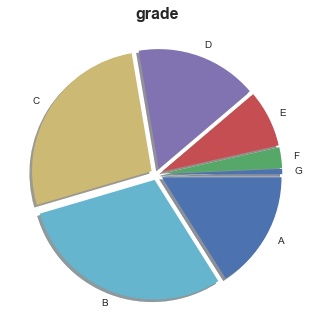

In [65]:
plt.pie(explode=[0.05, 0.05, 0.05, 0.05, 0.05, 0.05, 0.05], x=df_w['n_obs'], labels=df_w['grade'], shadow=True, labeldistance=1.1)
plt.title('grade', fontdict={'fontweight':'bold', 'fontsize':16})
plt.show()

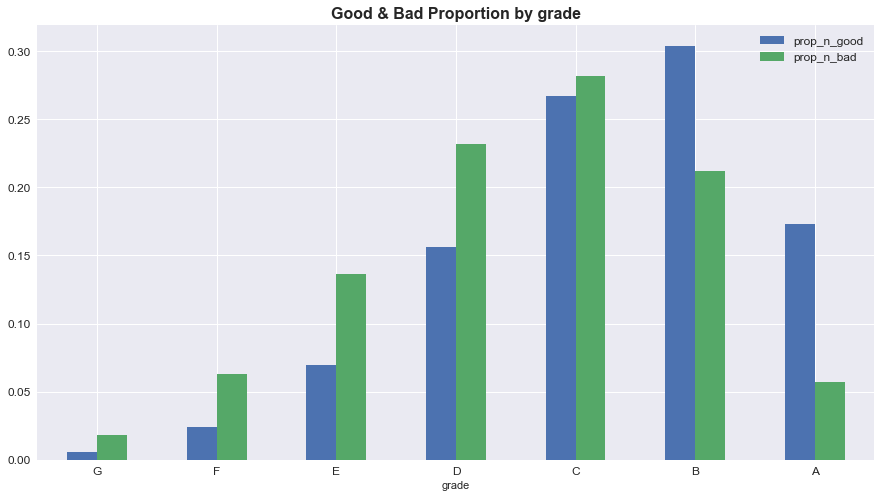

In [66]:
df_w.set_index('grade')[['prop_n_good', 'prop_n_bad']].plot(kind='bar', figsize=(15,8), fontsize=12)
plt.title('Good & Bad Proportion by grade', fontdict={'fontweight':'bold', 'fontsize':16})
plt.xticks(rotation=0)
plt.legend(fontsize=12)
plt.show()

### Preprocessing Discrete Variables: Plotting by Weight of Evidence

In [67]:
def plot_by_woe(df_WoE, rotation_of_xticks=0, fontsize_ticks=10):    # rotation_of_xticks = 0 by default
    x = np.array(df_WoE.iloc[:, 0].apply(str))            
    y = df_WoE['WoE']
    
    plt.figure(figsize=(15, 8))                         
    plt.plot(x, y, marker='o', linestyle='--', color='b')  
    plt.xlabel(df_WoE.columns[0], size=14)
    plt.ylabel('Weight of Evidence', size=14)
    plt.xticks(fontsize=fontsize_ticks, rotation = rotation_of_xticks)
    plt.yticks(fontsize=fontsize_ticks)
    plt.title('Weight of Evidence by ' + df_WoE.columns[0], fontdict={'fontweight':'bold', 'fontsize':16})  

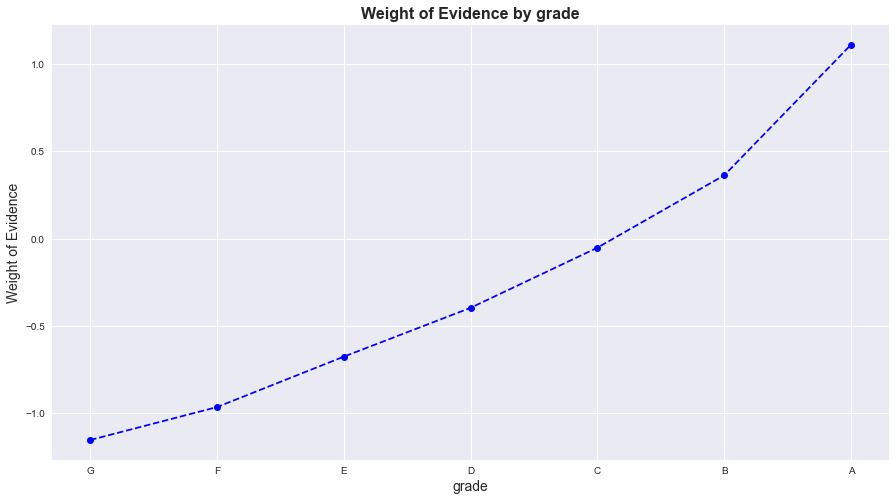

In [68]:
plot_by_woe(df_w)

### Preprocessing Discrete Variables: Coarse Classing and Creating Dummy Variables 

In [69]:
df_w = woe_discrete(df_pre_X, 'home_ownership', df_pre_Y)
df_w

,home_ownership,n_obs,prop_good,prop_n_obs,n_good,n_bad,prop_n_good,prop_n_bad,WoE,IV
0,OTHER,163,0.797546,0.000388,130.0,33.0,0.000348,0.000719,-0.726870,inf
1,NONE,45,0.866667,0.000107,39.0,6.0,0.000104,0.000131,-0.226094,inf
2,RENT,169380,0.873887,0.403616,148019.0,21361.0,0.395998,0.465696,-0.162123,inf
3,OWN,37487,0.891562,0.089328,33422.0,4065.0,0.089415,0.088622,0.008904,inf
4,MORTGAGE,212580,0.904017,0.506558,192176.0,20404.0,0.514132,0.444832,0.144784,inf
5,ANY,1,1.000000,0.000002,1.0,0.0,0.000003,0.000000,inf,inf


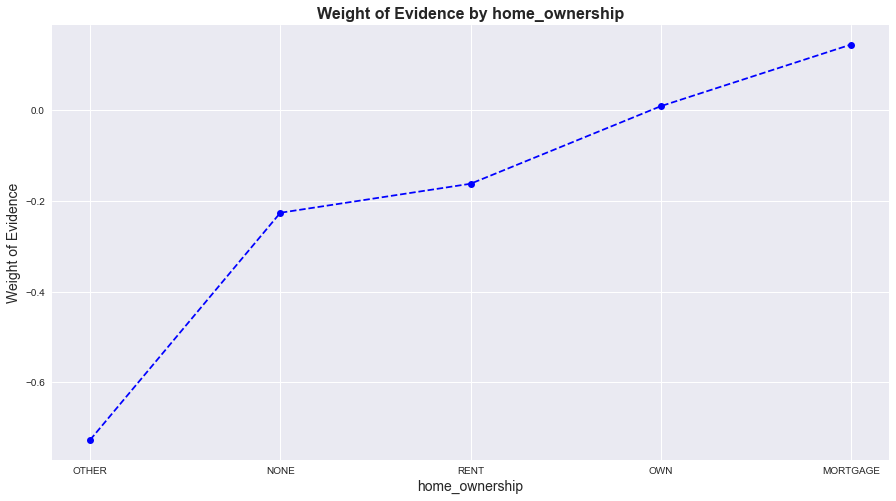

In [70]:
plot_by_woe(df_w)

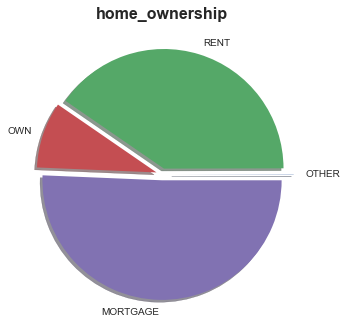

In [71]:
plt.pie(explode=[0.1, 0.05, 0.05, 0.05], x=df_w.loc[[0,2,3,4], 'n_obs'], labels=df_w.loc[[0,2,3,4], 'home_ownership'], shadow=True, labeldistance=1.1)
plt.title('home_ownership', fontdict={'fontweight':'bold', 'fontsize':16})
plt.show()

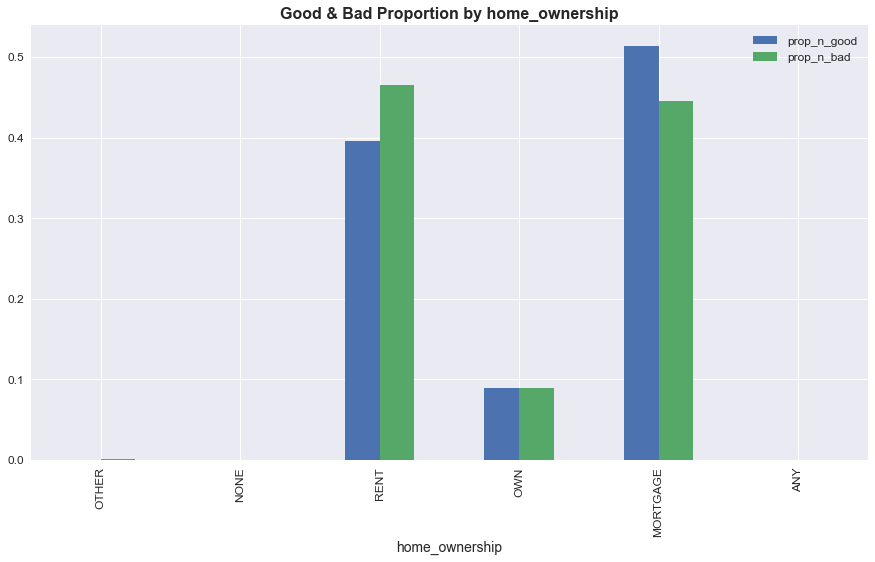

In [72]:
df_w.set_index('home_ownership')[['prop_n_good', 'prop_n_bad']].plot(kind='bar', figsize=(15,8), fontsize=12)
plt.title('Good & Bad Proportion by home_ownership', fontdict={'fontweight':'bold', 'fontsize':16})
plt.xlabel('home_ownership', fontsize=14)
plt.legend(fontsize=12)
plt.show()

In [73]:
# categories:
# 'home_ownership:OTHER_NONE_RENT_ANY'
# 'home_ownership:OWN'
# 'home_ownership:MORTGAGE'

df_pre_X['home_ownership:OTHER_NONE_RENT_ANY'] = sum([df_pre_X['home_ownership:OTHER'], df_pre_X['home_ownership:NONE'], 
                                                      df_pre_X['home_ownership:RENT'], df_pre_X['home_ownership:ANY']])

In [74]:
df_pre_X[['home_ownership', 'home_ownership:OTHER_NONE_RENT_ANY']].tail(10)

,home_ownership,home_ownership:OTHER_NONE_RENT_ANY
137337,RENT,1
54886,MORTGAGE,0
207892,MORTGAGE,0
110268,RENT,1
119879,MORTGAGE,0
259178,MORTGAGE,0
365838,RENT,1
131932,RENT,1
146867,MORTGAGE,0
121958,MORTGAGE,0


__addr_state__

In [75]:
df_pre_X['addr_state'].unique()

array(['GA', 'IL', 'TX', 'UT', 'CA', 'CT', 'IN', 'OH', 'NY', 'NC', 'AL',
       'NJ', 'MA', 'AR', 'VA', 'NH', 'WV', 'WA', 'FL', 'HI', 'CO', 'AZ',
       'PA', 'MO', 'KY', 'OK', 'MI', 'WI', 'SC', 'TN', 'DE', 'SD', 'MD',
       'LA', 'NV', 'RI', 'OR', 'MN', 'NM', 'MT', 'DC', 'MS', 'AK', 'KS',
       'VT', 'WY', 'ID', 'IA', 'NE', 'ME'], dtype=object)

In [76]:
df_w = woe_discrete(df_pre_X, 'addr_state', df_pre_Y)
df_w

,addr_state,n_obs,prop_good,prop_n_obs,n_good,n_bad,prop_n_good,prop_n_bad,WoE,IV
0,NE,13,0.461538,0.000031,6.0,7.0,0.000016,0.000153,-2.252047,inf
1,IA,13,0.769231,0.000031,10.0,3.0,0.000027,0.000065,-0.893924,inf
2,NV,5879,0.862051,0.014009,5068.0,811.0,0.013559,0.017681,-0.265463,inf
3,FL,28421,0.874811,0.067725,24863.0,3558.0,0.066516,0.077569,-0.153714,inf
4,HI,2231,0.875392,0.005316,1953.0,278.0,0.005225,0.006061,-0.148396,inf
5,AL,5287,0.877057,0.012598,4637.0,650.0,0.012405,0.014171,-0.133046,inf
6,OK,3698,0.882369,0.008812,3263.0,435.0,0.008730,0.009484,-0.082840,inf
7,NY,36218,0.883566,0.086304,32001.0,4217.0,0.085613,0.091936,-0.071253,inf
8,NM,2347,0.883681,0.005593,2074.0,273.0,0.005549,0.005952,-0.070134,inf
9,LA,4914,0.884005,0.011710,4344.0,570.0,0.011622,0.012427,-0.066982,inf


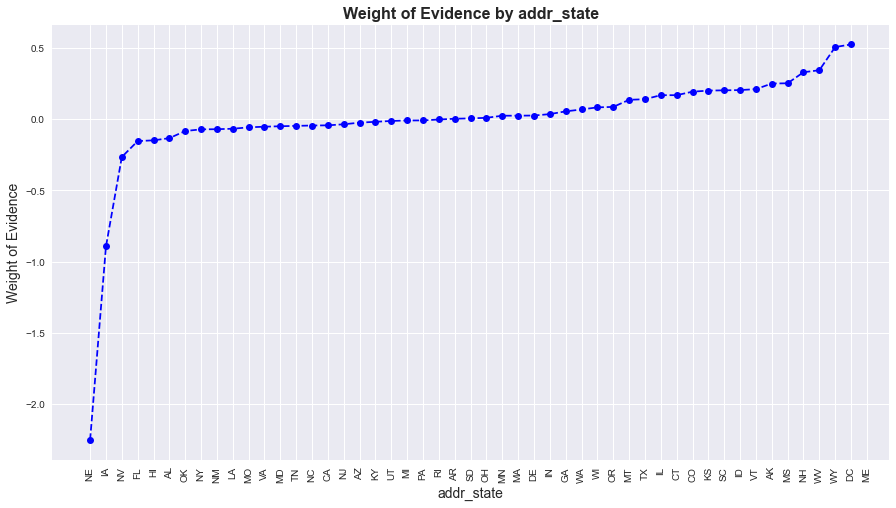

In [77]:
plot_by_woe(df_w, 90)

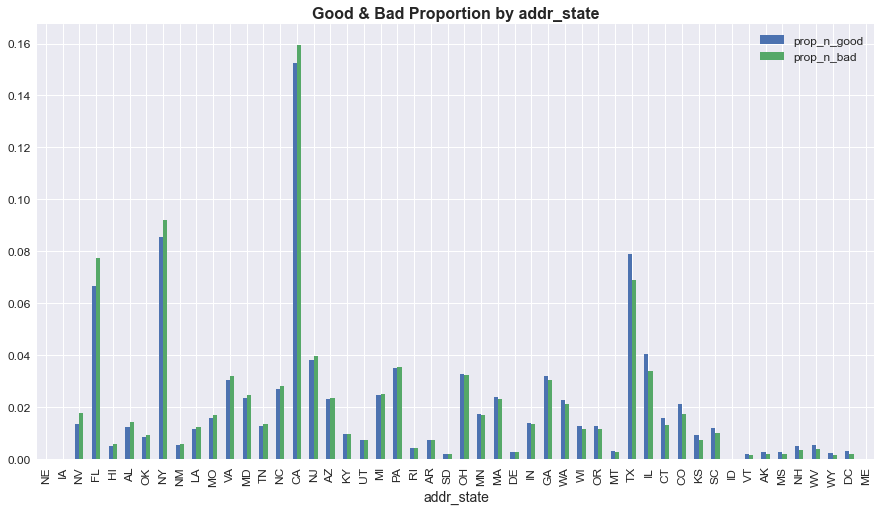

In [78]:
df_w.set_index('addr_state')[['prop_n_good', 'prop_n_bad']].plot(kind='bar', figsize=(15,8), fontsize=12)
plt.title('Good & Bad Proportion by addr_state', fontdict={'fontweight':'bold', 'fontsize':16})
plt.xlabel('addr_state', fontsize=14)
plt.legend(fontsize=12)
plt.show()

There are no borrowers from North Dakota (ND). We add ND to add_state if there are any borrowers later.

In [79]:
# df_inputs_prepr['addr_state:ND']    # ERROR

In [80]:
if ['addr_state:ND'] in df_pre_X.columns.values:
    pass      
else:
    df_pre_X['addr_state:ND'] = 0  

We consider the state with no data in the __category with the highest risk__.

In [81]:
# We define the following categories based on WoE and the number of observations:

# 'ND' 'NE' 'IA' NV' 'FL' 'HI' 'AL'
# 'NM' 'VA'
# 'NY'
# 'OK' 'TN' 'MO' 'LA' 'MD' 'NC'
# 'CA'
# 'UT' 'KY' 'AZ' 'NJ'
# 'AR' 'MI' 'PA' 'OH' 'MN'
# 'RI' 'MA' 'DE' 'SD' 'IN'
# 'GA' 'WA' 'OR'
# 'WI' 'MT'
# 'TX'
# 'IL' 'CT'
# 'KS' 'SC' 'CO' 'VT' 'AK' 'MS'
# 'WV' 'NH' 'WY' 'DC' 'ME' 'ID'

# 'ND_NE_IA_NV_FL_HI_AL' is the reference category.

df_pre_X['addr_state:ND_NE_IA_NV_FL_HI_AL'] = sum([df_pre_X['addr_state:ND'], df_pre_X['addr_state:NE'],
                                                   df_pre_X['addr_state:IA'], df_pre_X['addr_state:NV'],
                                                   df_pre_X['addr_state:FL'], df_pre_X['addr_state:HI'],
                                                          df_pre_X['addr_state:AL']])

df_pre_X['addr_state:NM_VA'] = sum([df_pre_X['addr_state:NM'], df_pre_X['addr_state:VA']])

df_pre_X['addr_state:OK_TN_MO_LA_MD_NC'] = sum([df_pre_X['addr_state:OK'], df_pre_X['addr_state:TN'],
                                              df_pre_X['addr_state:MO'], df_pre_X['addr_state:LA'],
                                              df_pre_X['addr_state:MD'], df_pre_X['addr_state:NC']])

df_pre_X['addr_state:UT_KY_AZ_NJ'] = sum([df_pre_X['addr_state:UT'], df_pre_X['addr_state:KY'],
                                              df_pre_X['addr_state:AZ'], df_pre_X['addr_state:NJ']])

df_pre_X['addr_state:AR_MI_PA_OH_MN'] = sum([df_pre_X['addr_state:AR'], df_pre_X['addr_state:MI'],
                                              df_pre_X['addr_state:PA'], df_pre_X['addr_state:OH'],
                                              df_pre_X['addr_state:MN']])

df_pre_X['addr_state:RI_MA_DE_SD_IN'] = sum([df_pre_X['addr_state:RI'], df_pre_X['addr_state:MA'],
                                              df_pre_X['addr_state:DE'], df_pre_X['addr_state:SD'],
                                              df_pre_X['addr_state:IN']])

df_pre_X['addr_state:GA_WA_OR'] = sum([df_pre_X['addr_state:GA'], df_pre_X['addr_state:WA'], df_pre_X['addr_state:OR']])

df_pre_X['addr_state:WI_MT'] = sum([df_pre_X['addr_state:WI'], df_pre_X['addr_state:MT']])

df_pre_X['addr_state:IL_CT'] = sum([df_pre_X['addr_state:IL'], df_pre_X['addr_state:CT']])

df_pre_X['addr_state:KS_SC_CO_VT_AK_MS'] = sum([df_pre_X['addr_state:KS'], df_pre_X['addr_state:SC'],
                                              df_pre_X['addr_state:CO'], df_pre_X['addr_state:VT'],
                                              df_pre_X['addr_state:AK'], df_pre_X['addr_state:MS']])

df_pre_X['addr_state:WV_NH_WY_DC_ME_ID'] = sum([df_pre_X['addr_state:WV'], df_pre_X['addr_state:NH'],
                                              df_pre_X['addr_state:WY'], df_pre_X['addr_state:DC'],
                                              df_pre_X['addr_state:ME'], df_pre_X['addr_state:ID']])

__verification_status: Indicates if the co-borrowers' joint income was verified by LC, not verified, or if the income source was verified__

In [82]:
df_pre_X['verification_status'].unique()

array(['Verified', 'Not Verified', 'Source Verified'], dtype=object)

In [83]:
df_w = woe_discrete(df_pre_X, 'verification_status', df_pre_Y)
df_w

,verification_status,n_obs,prop_good,prop_n_obs,n_good,n_bad,prop_n_good,prop_n_bad,WoE,IV
0,Verified,151269,0.872578,0.360460,131994.0,19275.0,0.353126,0.420218,-0.173949,0.020979
1,Source Verified,135029,0.895896,0.321761,120972.0,14057.0,0.323639,0.306460,0.054542,0.020979
2,Not Verified,133358,0.905990,0.317779,120821.0,12537.0,0.323235,0.273322,0.167729,0.020979


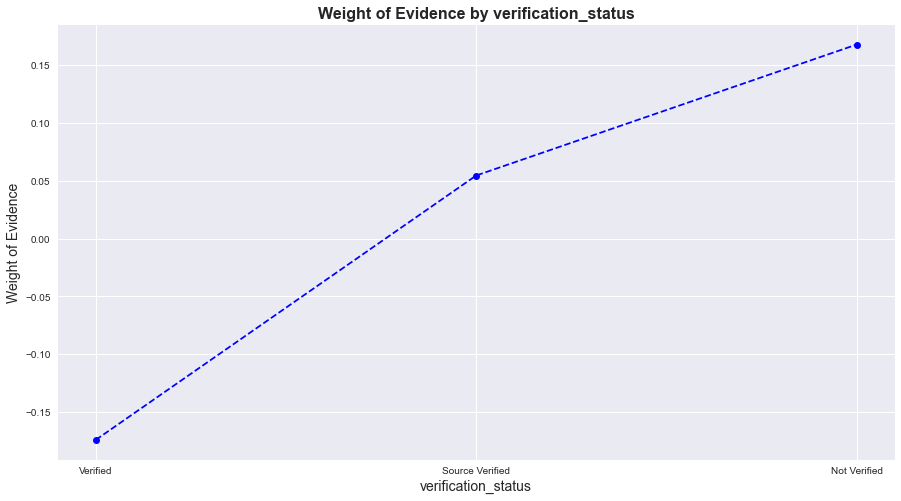

In [84]:
plot_by_woe(df_w)

__purpose: A category provided by the borrower for the loan request__

In [85]:
df_pre_X['purpose'].unique()

array(['home_improvement', 'debt_consolidation', 'credit_card',
       'small_business', 'other', 'medical', 'major_purchase',
       'educational', 'moving', 'vacation', 'car', 'wedding', 'house',
       'renewable_energy'], dtype=object)

In [86]:
df_w= woe_discrete(df_pre_X, 'purpose', df_pre_Y)
df_w

,purpose,n_obs,prop_good,prop_n_obs,n_good,n_bad,prop_n_good,prop_n_bad,WoE,IV
0,small_business,6298,0.784217,0.015008,4939.0,1359.0,0.013213,0.029628,-0.807483,0.036688
1,educational,385,0.792208,0.000917,305.0,80.0,0.000816,0.001744,-0.759611,0.036688
2,moving,2691,0.844667,0.006412,2273.0,418.0,0.006081,0.009113,-0.404522,0.036688
3,renewable_energy,314,0.853503,0.000748,268.0,46.0,0.000717,0.001003,-0.335551,0.036688
4,house,2037,0.861561,0.004854,1755.0,282.0,0.004695,0.006148,-0.269580,0.036688
5,other,21288,0.861706,0.050727,18344.0,2944.0,0.049076,0.064183,-0.268363,0.036688
6,medical,4136,0.866296,0.009856,3583.0,553.0,0.009586,0.012056,-0.229299,0.036688
7,wedding,2112,0.879261,0.005033,1857.0,255.0,0.004968,0.005559,-0.112443,0.036688
8,vacation,2217,0.881822,0.005283,1955.0,262.0,0.005230,0.005712,-0.088096,0.036688
9,debt_consolidation,246769,0.886842,0.588027,218845.0,27924.0,0.585481,0.608777,-0.039019,0.036688


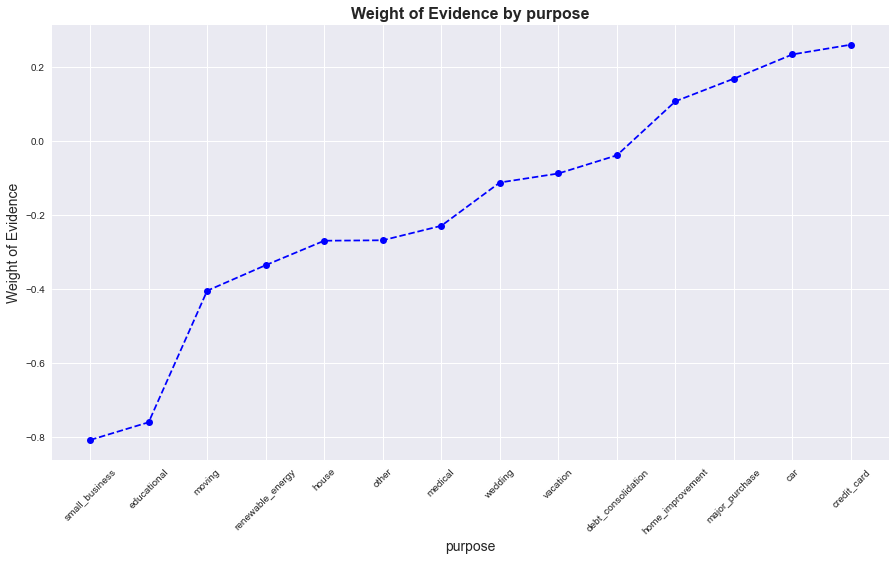

In [87]:
plot_by_woe(df_w, 45)

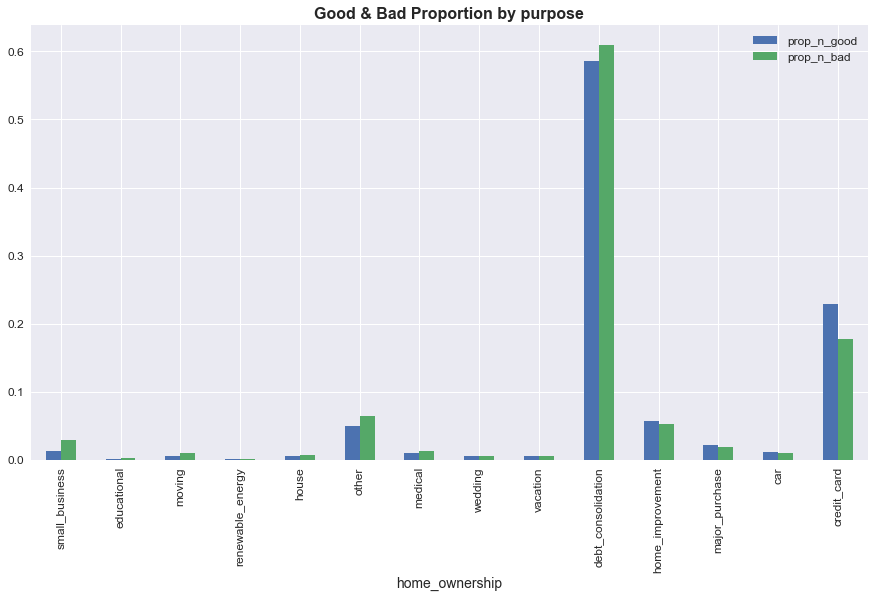

In [88]:
df_w.set_index(['purpose'])[['prop_n_good', 'prop_n_bad']].plot(kind='bar', figsize=(15,8), fontsize=12)
plt.title('Good & Bad Proportion by purpose', fontdict={'fontweight':'bold', 'fontsize':16})
plt.xlabel('home_ownership', fontsize=14)
plt.legend(fontsize=12)
plt.show()

In [89]:
# We consider the following categories:
# 'small_business', 'educational', moving', 'renewable_energy', 'house', 'other'
# 'medical', 'wedding', 'vacation' 
# 'home_improvement', 'major_purchase', 'car' 
# 'debt_consolidtion' 
# 'credit_card' 

# 'sm_b__edu__mov__ren_en__house__oth' is the reference category.
df_pre_X['purpose:sm_b__edu__mov__ren_en__house__oth'] = sum([df_pre_X['purpose:small_business'], df_pre_X['purpose:educational'], 
                                                             df_pre_X['purpose:moving'], df_pre_X['purpose:renewable_energy'],
                                                             df_pre_X['purpose:house'], df_pre_X['purpose:other']])
df_pre_X['purpose:med__wed__vacation'] = sum([df_pre_X['purpose:medical'], df_pre_X['purpose:wedding'], df_pre_X['purpose:vacation']])
df_pre_X['purpose:home_impr__major_purch__car'] = sum([df_pre_X['purpose:home_improvement'], df_pre_X['purpose:major_purchase'], 
                                                       df_pre_X['purpose:car']])

__initial_list_status__

In [90]:
df_pre_X['initial_list_status'].unique()

array(['f', 'w'], dtype=object)

In [91]:
df_w = woe_discrete(df_pre_X, 'initial_list_status', df_pre_Y)
df_w

,initial_list_status,n_obs,prop_good,prop_n_obs,n_good,n_bad,prop_n_good,prop_n_bad,WoE,IV
0,f,272775,0.879633,0.649997,239942.0,32833.0,0.641922,0.715799,-0.108933,0.025119
1,w,146881,0.911248,0.350003,133845.0,13036.0,0.358078,0.284201,0.231071,0.025119


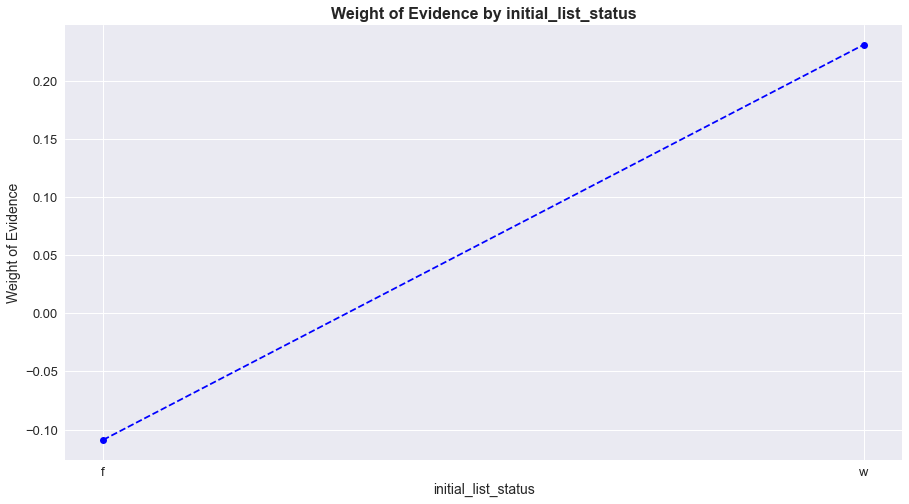

In [92]:
plot_by_woe(df_w, fontsize_ticks=13)

### Preprocessing Ordered Discrete and Continuous Variables

In [93]:
# It calculates the 'Weigth of Evidence' for ordered discrete and continuous variables
def woe_ordered_continuous(df, variable_name, good_bad_df):
    df = pd.concat([df[variable_name], good_bad_df], axis=1)
    df = pd.concat([df.groupby(variable_name, as_index=False)[df.columns[1]].count(),
                    df.groupby(variable_name, as_index=False)[df.columns[1]].mean()], axis=1)
   
    df = df.iloc[:, [0, 1, 3]]
    df.columns = [variable_name, 'n_obs', 'prop_good']
    df['prop_n_obs'] = df['n_obs'] / df['n_obs'].sum()
    
    df['n_good'] = df['prop_good'] * df['n_obs']
    df['n_bad'] = (1 - df['prop_good']) * df['n_obs']
    
    df['prop_n_good'] = df['n_good'] / df['n_good'].sum()
    df['prop_n_bad'] = df['n_bad'] / df['n_bad'].sum()
    df['WoE'] = np.log(df['prop_n_good'] / df['prop_n_bad'])
    
    df['IV'] = ((df['prop_n_good'] - df['prop_n_bad']) * df['WoE']).sum()

    return df

### Preprocessing Continuous Variables: Fine Classing and Coarse Classing

__term_int__

In [94]:
df_pre_X['term_int'].unique()

array([36, 60], dtype=int64)

In [95]:
df_w = woe_ordered_continuous(df_pre_X, 'term_int', df_pre_Y)
df_w

,term_int,n_obs,prop_good,prop_n_obs,n_good,n_bad,prop_n_good,prop_n_bad,WoE,IV
0,36,304132,0.903045,0.724717,274645.0,29487.0,0.734763,0.642852,0.133633,0.039628
1,60,115524,0.858194,0.275283,99142.0,16382.0,0.265237,0.357148,-0.297527,0.039628


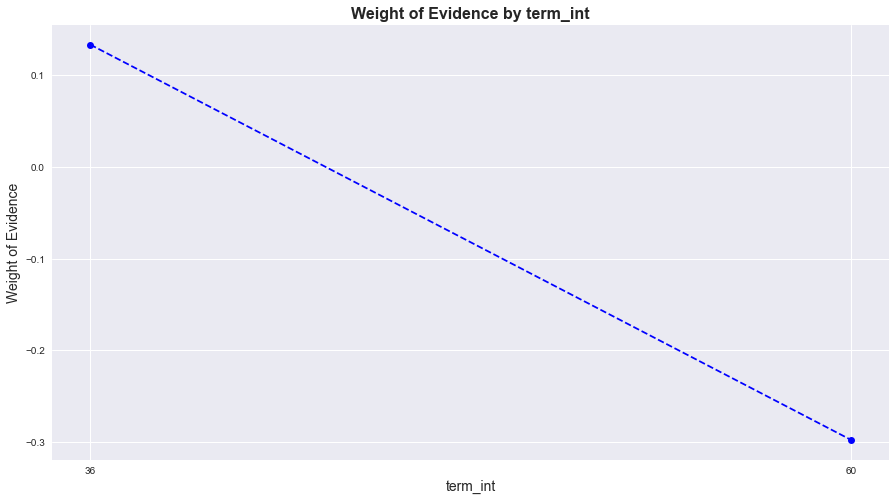

In [96]:
plot_by_woe(df_w)

In [97]:
df_pre_X['term:36'] = np.where((df_pre_X['term_int'] == 36), 1, 0)
df_pre_X['term:60'] = np.where((df_pre_X['term_int'] == 60), 1, 0)

__emp_length_int__

In [98]:
df_pre_X['emp_length_int'].unique()

array([10.0, 7.0, 6.0, 2.0, 0.0, 8.0, 4.0, 3.0, 1.0, 5.0, 9.0, '0'],
      dtype=object)

In [99]:
df_w = woe_ordered_continuous(df_pre_X, 'emp_length_int', df_pre_Y)
df_w

,emp_length_int,n_obs,prop_good,prop_n_obs,n_good,n_bad,prop_n_good,prop_n_bad,WoE,IV
0,0.0,32544,0.881760,0.077549,28696.0,3848.0,0.076771,0.083891,-0.088692,0.006998
1,1.0,26601,0.886809,0.063388,23590.0,3011.0,0.063111,0.065643,-0.039346,0.006998
2,2.0,37212,0.889982,0.088673,33118.0,4094.0,0.088601,0.089254,-0.007342,0.006998
3,3.0,32930,0.890161,0.078469,29313.0,3617.0,0.078422,0.078855,-0.005510,0.006998
4,4.0,25250,0.890376,0.060168,22482.0,2768.0,0.060147,0.060346,-0.003307,0.006998
5,5.0,27684,0.885096,0.065968,24503.0,3181.0,0.065553,0.069350,-0.056297,0.006998
6,6.0,23497,0.883602,0.055991,20762.0,2735.0,0.055545,0.059626,-0.070904,0.006998
7,7.0,23559,0.887771,0.056139,20915.0,2644.0,0.055954,0.057642,-0.029723,0.006998
8,8.0,20133,0.890031,0.047975,17919.0,2214.0,0.047939,0.048268,-0.006836,0.006998
9,9.0,16126,0.887325,0.038427,14309.0,1817.0,0.038281,0.039613,-0.034195,0.006998


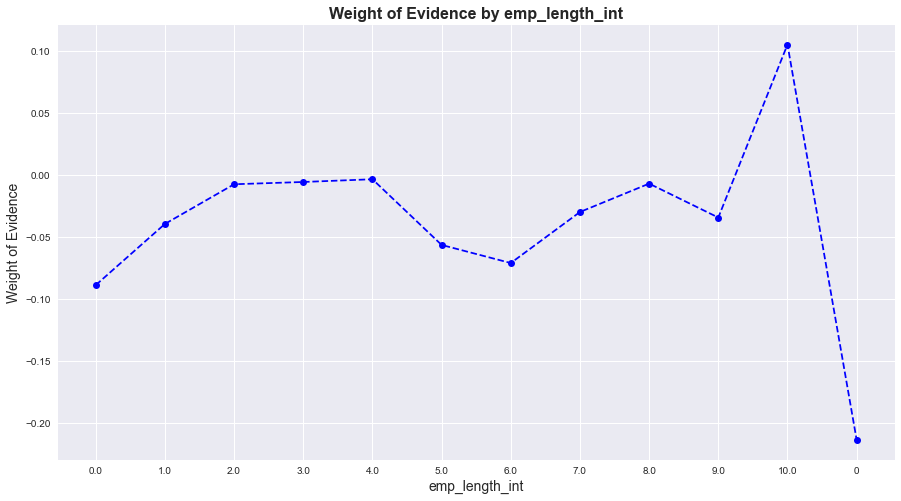

In [100]:
plot_by_woe(df_w)

In [101]:
df_pre_X['emp_length:0'] = np.where(df_pre_X['emp_length_int'] == 0, 1, 0)    
df_pre_X['emp_length:1'] = np.where(df_pre_X['emp_length_int'].isin([1]), 1, 0)
df_pre_X['emp_length:2-4'] = np.where(df_pre_X['emp_length_int'].isin(range(2, 5)), 1, 0)
df_pre_X['emp_length:5-6'] = np.where(df_pre_X['emp_length_int'].isin(range(5, 7)), 1, 0)
df_pre_X['emp_length:7-9'] = np.where(df_pre_X['emp_length_int'].isin(range(7, 10)), 1, 0)
df_pre_X['emp_length:10'] = np.where(df_pre_X['emp_length_int'] == 10, 1, 0)

__mths_since_issue_d: The number of months since the loan was funded__

In [102]:
df_pre_X['mths_since_issue_d'].unique()

array([110, 104, 114,  97, 118, 105, 107, 136, 122, 101, 121, 127, 115,
       126, 108, 117,  98, 102, 103, 113,  99, 133, 112, 120, 106, 129,
       116, 111, 140, 168, 130, 132, 123, 124, 109, 119, 160, 162, 145,
       156, 134, 125, 138, 171, 152, 153, 100, 142, 148, 147, 128, 137,
       155, 146, 143, 154, 150, 141, 135, 159, 144, 149, 139, 161, 157,
       175, 151, 131, 181, 167, 164, 158, 163, 166, 165, 182, 180, 170,
       178, 177, 174, 173, 169, 183, 179, 176, 187, 185, 186, 172, 184],
      dtype=int64)

In [103]:
df_pre_X['mths_since_issue_d_factor'] = pd.cut(df_pre_X['mths_since_issue_d'], 50)   
df_pre_X['mths_since_issue_d_factor']   

58619     (109.6, 111.4]
389825    (102.4, 104.2]
119082    (113.2, 115.0]
232381     (96.91, 98.8]
155122    (116.8, 118.6]
406818    (104.2, 106.0]
446563    (106.0, 107.8]
6739      (134.8, 136.6]
185068    (120.4, 122.2]
384618    (102.4, 104.2]
321363    (100.6, 102.4]
178505    (120.4, 122.2]
232090     (96.91, 98.8]
213193    (125.8, 127.6]
134285    (113.2, 115.0]
210842    (125.8, 127.6]
455409    (107.8, 109.6]
64550     (109.6, 111.4]
154368    (116.8, 118.6]
231742     (96.91, 98.8]
240484     (96.91, 98.8]
338989    (100.6, 102.4]
367559    (102.4, 104.2]
107429    (111.4, 113.2]
290034     (98.8, 100.6]
866       (131.2, 133.0]
323777    (100.6, 102.4]
350927    (100.6, 102.4]
400559    (104.2, 106.0]
342320    (100.6, 102.4]
335970    (100.6, 102.4]
97120     (111.4, 113.2]
384001    (102.4, 104.2]
1045      (131.2, 133.0]
176522    (118.6, 120.4]
260398     (96.91, 98.8]
156356    (116.8, 118.6]
422145    (104.2, 106.0]
125927    (113.2, 115.0]
314670    (100.6, 102.4]


In [104]:
df_w = woe_ordered_continuous(df_pre_X, 'mths_since_issue_d_factor', df_pre_Y)
df_w

,mths_since_issue_d_factor,n_obs,prop_good,prop_n_obs,n_good,n_bad,prop_n_good,prop_n_bad,WoE,IV
0,"(96.91, 98.8]",31743,0.942539,0.075641,29919.0,1824.0,0.080043,0.039765,0.699565,0.113513
1,"(98.8, 100.6]",44492,0.928571,0.106020,41314.0,3178.0,0.110528,0.069284,0.467053,0.113513
2,"(100.6, 102.4]",43446,0.917092,0.103528,39844.0,3602.0,0.106595,0.078528,0.305586,0.113513
3,"(102.4, 104.2]",32648,0.908601,0.077797,29664.0,2984.0,0.079361,0.065055,0.198773,0.113513
4,"(104.2, 106.0]",31983,0.901448,0.076212,28831.0,3152.0,0.077132,0.068717,0.115517,0.113513
5,"(106.0, 107.8]",13696,0.898949,0.032636,12312.0,1384.0,0.032939,0.030173,0.087700,0.113513
6,"(107.8, 109.6]",27549,0.898907,0.065647,24764.0,2785.0,0.066252,0.060716,0.087247,0.113513
7,"(109.6, 111.4]",25902,0.888889,0.061722,23024.0,2878.0,0.061597,0.062744,-0.018455,0.113513
8,"(111.4, 113.2]",23114,0.880202,0.055078,20345.0,2769.0,0.054429,0.060368,-0.103548,0.113513
9,"(113.2, 115.0]",20525,0.868015,0.048909,17816.0,2709.0,0.047664,0.059059,-0.214379,0.113513


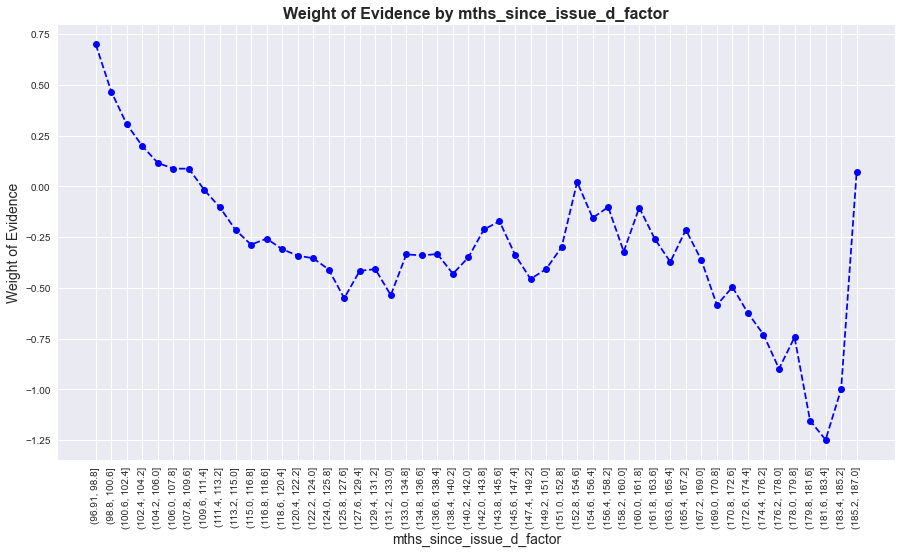

In [105]:
plot_by_woe(df_w, 90)

In [106]:
df_pre_X['mths_since_issue_d:<104'] = np.where(df_pre_X['mths_since_issue_d'].isin(range(0, 104)), 1, 0)
df_pre_X['mths_since_issue_d:104-105'] = np.where(df_pre_X['mths_since_issue_d'].isin(range(104, 105)), 1, 0)
df_pre_X['mths_since_issue_d:105-110'] = np.where(df_pre_X['mths_since_issue_d'].isin(range(105, 110)), 1, 0)
df_pre_X['mths_since_issue_d:110-114'] = np.where(df_pre_X['mths_since_issue_d'].isin(range(110, 114)), 1, 0)
df_pre_X['mths_since_issue_d:114-125'] = np.where(df_pre_X['mths_since_issue_d'].isin(range(114, 125)), 1, 0)
df_pre_X['mths_since_issue_d:125-134'] = np.where(df_pre_X['mths_since_issue_d'].isin(range(125, 134)), 1, 0)
df_pre_X['mths_since_issue_d:134-153'] = np.where(df_pre_X['mths_since_issue_d'].isin(range(134, 153)), 1, 0)
df_pre_X['mths_since_issue_d:153-170'] = np.where(df_pre_X['mths_since_issue_d'].isin(range(153, 170)), 1, 0)
df_pre_X['mths_since_issue_d:170-186'] = np.where(df_pre_X['mths_since_issue_d'].isin(range(170, 186)), 1, 0)
df_pre_X['mths_since_issue_d:>=186'] = np.where(df_pre_X['mths_since_issue_d'] >= 186, 1, 0)

__int_rate: Interest Rate on the loan__

In [107]:
df_pre_X['int_rate'].unique()

array([13.67, 10.99, 15.22, 11.44, 13.11, 24.5 , 15.61,  8.9 , 10.16,
       14.99, 11.67, 15.31, 11.99, 17.99, 15.8 , 22.4 , 23.63, 12.39,
        7.49,  9.17, 17.57, 12.42, 19.52, 14.64, 14.49, 12.99, 20.31,
        6.49, 18.64, 15.99, 19.05, 11.14, 13.35,  6.62, 20.49, 12.35,
       18.55, 13.66, 12.12,  6.03, 10.64, 17.49, 14.3 , 23.76,  8.  ,
        7.9 , 14.65,  8.39, 16.77, 17.77, 13.65, 13.98, 14.09,  7.62,
       15.59, 10.15, 12.18, 24.08,  9.67, 22.95, 25.89, 12.61, 15.1 ,
       23.7 , 10.25, 20.99, 17.27,  9.91, 13.05, 17.1 , 12.49, 15.62,
       16.2 , 12.53, 19.22, 20.2 , 18.25, 14.16, 16.29, 22.47, 24.99,
       14.33, 21.98, 14.31, 10.37, 18.99,  7.88, 14.98,  6.92, 16.78,
       19.03, 10.74, 11.55, 19.2 ,  7.69,  9.71, 12.85, 17.76, 12.98,
       16.49, 15.88,  9.49,  5.79, 21.  ,  9.25, 23.28, 18.92, 11.71,
       13.68,  8.19, 21.6 , 18.54, 18.24, 13.06,  7.14, 24.89, 22.7 ,
       17.58, 16.99, 13.99, 19.47, 14.47, 19.72, 22.9 , 11.12,  5.42,
       25.28, 25.8 ,

In [108]:
df_pre_X['int_rate_factor'] = pd.cut(df_pre_X['int_rate'], 50)

In [109]:
df_w = woe_ordered_continuous(df_pre_X, 'int_rate_factor', df_pre_Y)
df_w

,int_rate_factor,n_obs,prop_good,prop_n_obs,n_good,n_bad,prop_n_good,prop_n_bad,WoE,IV
0,"(5.399, 5.833]",882,0.961451,0.002102,848.0,34.0,0.002269,0.000741,1.118624,0.344977
1,"(5.833, 6.246]",9532,0.980802,0.022714,9349.0,183.0,0.025012,0.003990,1.835642,0.344977
2,"(6.246, 6.658]",8796,0.971578,0.020960,8546.0,250.0,0.022863,0.005450,1.433861,0.344977
3,"(6.658, 7.071]",2058,0.971331,0.004904,1999.0,59.0,0.005348,0.001286,1.424968,0.344977
4,"(7.071, 7.484]",3550,0.977183,0.008459,3469.0,81.0,0.009281,0.001766,1.659276,0.344977
5,"(7.484, 7.897]",14208,0.962416,0.033856,13674.0,534.0,0.036582,0.011642,1.144959,0.344977
6,"(7.897, 8.31]",10911,0.948492,0.026000,10349.0,562.0,0.027687,0.012252,0.815247,0.344977
7,"(8.31, 8.722]",7413,0.965061,0.017664,7154.0,259.0,0.019139,0.005647,1.220702,0.344977
8,"(8.722, 9.135]",10768,0.938243,0.025659,10103.0,665.0,0.027029,0.014498,0.622904,0.344977
9,"(9.135, 9.548]",7476,0.964553,0.017815,7211.0,265.0,0.019292,0.005777,1.205736,0.344977


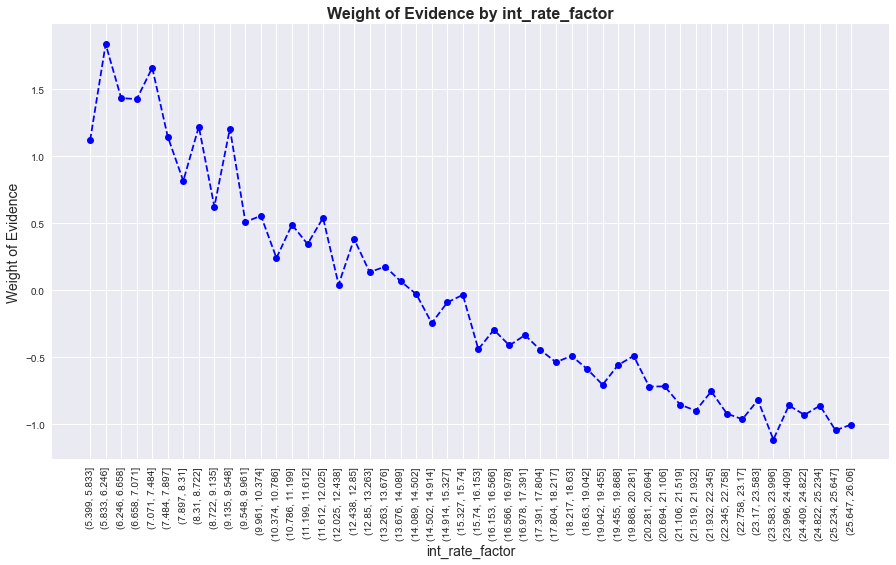

In [110]:
plot_by_woe(df_w, 90)

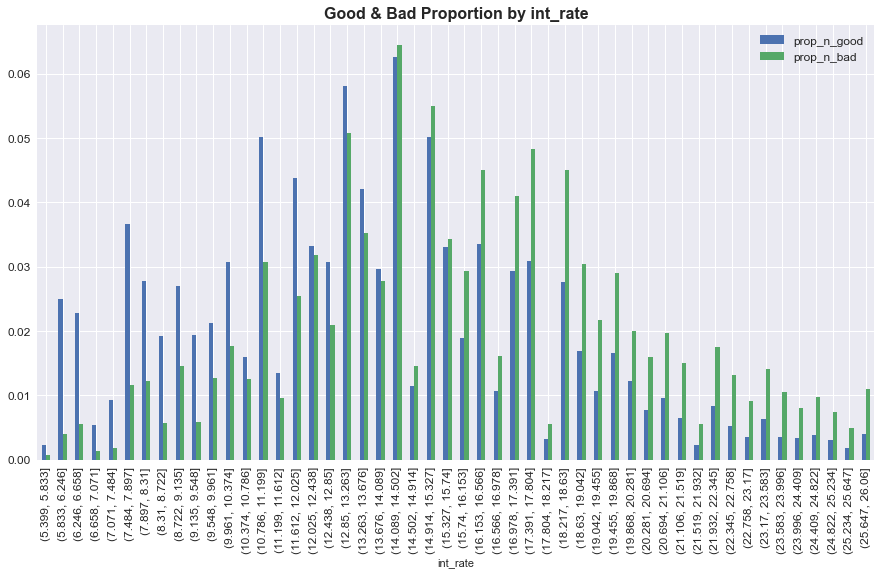

In [111]:
df_w.set_index(['int_rate_factor'])[['prop_n_good', 'prop_n_bad']].plot(kind='bar', figsize=(15,8), fontsize=12)
plt.title('Good & Bad Proportion by int_rate', fontdict={'fontweight':'bold', 'fontsize':16})
plt.xlabel('int_rate')
plt.legend(fontsize=12)
plt.show()

In [112]:
df_pre_X['int_rate:<=9.548'] = np.where((df_pre_X['int_rate'] <= 9.548), 1, 0)
df_pre_X['int_rate:9.548-12.025'] = np.where((df_pre_X['int_rate'] > 9.548) & (df_pre_X['int_rate'] <= 12.025), 1, 0)
df_pre_X['int_rate:12.025-15.74'] = np.where((df_pre_X['int_rate'] > 12.025) & (df_pre_X['int_rate'] <= 15.74), 1, 0)
df_pre_X['int_rate:15.74-21.106'] = np.where((df_pre_X['int_rate'] > 15.74) & (df_pre_X['int_rate'] <= 21.106), 1, 0)
df_pre_X['int_rate:>21.106'] = np.where((df_pre_X['int_rate'] > 21.106), 1, 0)

__funded_amnt__

In [113]:
df_pre_X['funded_amnt_factor'] = pd.cut(df_pre_X['funded_amnt'], 50)
df_w = woe_ordered_continuous(df_pre_X, 'funded_amnt_factor', df_pre_Y)
df_w

,funded_amnt_factor,n_obs,prop_good,prop_n_obs,n_good,n_bad,prop_n_good,prop_n_bad,WoE,IV
0,"(465.5, 1190.0]",1385,0.900361,0.003300,1247.0,138.0,0.003336,0.003009,0.103346,0.014225
1,"(1190.0, 1880.0]",3414,0.901582,0.008135,3078.0,336.0,0.008235,0.007325,0.117028,0.014225
2,"(1880.0, 2570.0]",6784,0.894458,0.016166,6068.0,716.0,0.016234,0.015610,0.039208,0.014225
3,"(2570.0, 3260.0]",8132,0.890064,0.019378,7238.0,894.0,0.019364,0.019490,-0.006502,0.014225
4,"(3260.0, 3950.0]",5356,0.891897,0.012763,4777.0,579.0,0.012780,0.012623,0.012369,0.014225
5,"(3950.0, 4640.0]",10186,0.889358,0.024272,9059.0,1127.0,0.024236,0.024570,-0.013697,0.014225
6,"(4640.0, 5330.0]",17833,0.892222,0.042494,15911.0,1922.0,0.042567,0.041902,0.015748,0.014225
7,"(5330.0, 6020.0]",19292,0.906853,0.045971,17495.0,1797.0,0.046805,0.039177,0.177900,0.014225
8,"(6020.0, 6710.0]",7799,0.886652,0.018584,6915.0,884.0,0.018500,0.019272,-0.040905,0.014225
9,"(6710.0, 7400.0]",13227,0.898465,0.031519,11884.0,1343.0,0.031794,0.029279,0.082390,0.014225


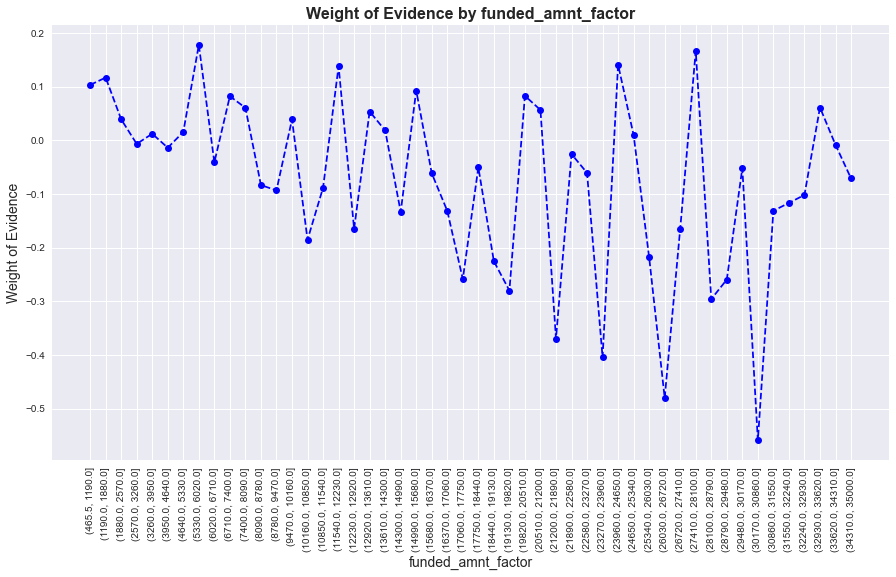

In [114]:
plot_by_woe(df_w, 90)

There are no relationships between 'funded amount' and 'WoE'. Hence, we __do not to include the funded amount variable in the PD model__.  

__mths_since_earliest_cr_line__

In [115]:
df_pre_X['mths_since_earliest_cr_line_factor'] = pd.cut(df_pre_X['mths_since_earliest_cr_line'], 50)
df_w = woe_ordered_continuous(df_pre_X, 'mths_since_earliest_cr_line_factor', df_pre_Y)
df_w

,mths_since_earliest_cr_line_factor,n_obs,prop_good,prop_n_obs,n_good,n_bad,prop_n_good,prop_n_bad,WoE,IV
0,"(-0.948, 18.96]",27,0.888889,0.000064,24.0,3.0,0.000064,0.000065,-0.018455,inf
1,"(18.96, 37.92]",0,NaN,0.000000,NaN,NaN,NaN,NaN,NaN,inf
2,"(37.92, 56.88]",0,NaN,0.000000,NaN,NaN,NaN,NaN,NaN,inf
3,"(56.88, 75.84]",0,NaN,0.000000,NaN,NaN,NaN,NaN,NaN,inf
4,"(75.84, 94.8]",0,NaN,0.000000,NaN,NaN,NaN,NaN,NaN,inf
5,"(94.8, 113.76]",0,NaN,0.000000,NaN,NaN,NaN,NaN,NaN,inf
6,"(113.76, 132.72]",0,NaN,0.000000,NaN,NaN,NaN,NaN,NaN,inf
7,"(132.72, 151.68]",2445,0.898978,0.005826,2198.0,247.0,0.005880,0.005385,0.088018,inf
8,"(151.68, 170.64]",4950,0.863636,0.011795,4275.0,675.0,0.011437,0.014716,-0.252070,inf
9,"(170.64, 189.6]",13920,0.866164,0.033170,12057.0,1863.0,0.032256,0.040616,-0.230439,inf


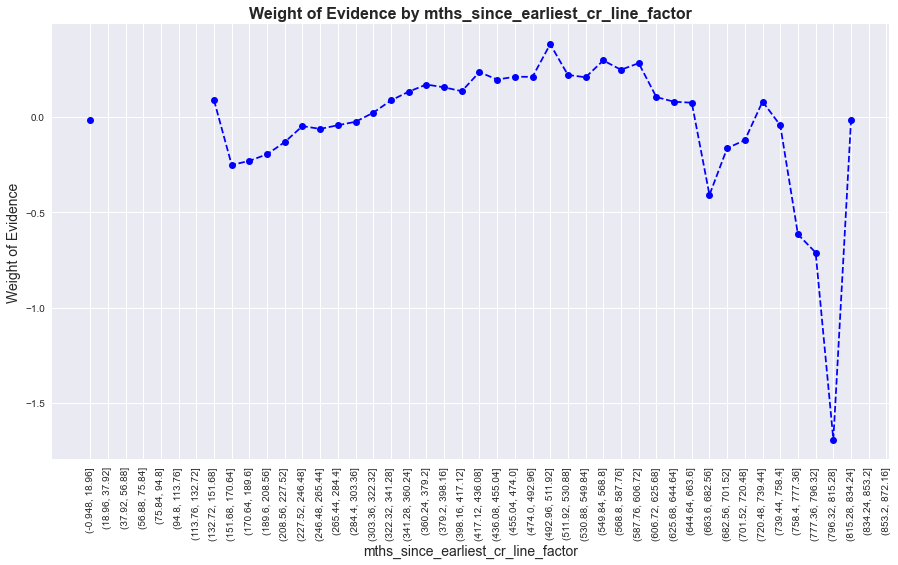

In [116]:
plot_by_woe(df_w, 90)

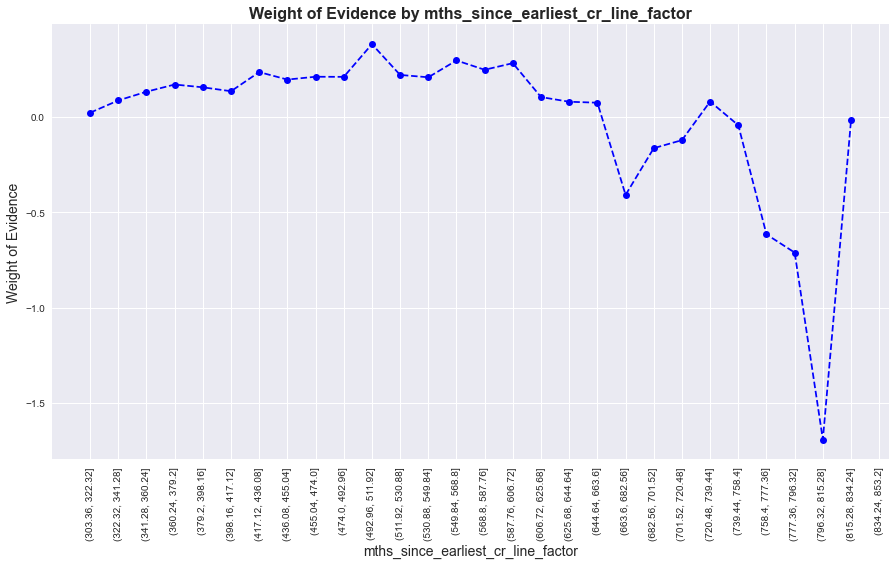

In [117]:
plot_by_woe(df_w.iloc[16:, :], 90)

In [118]:
df_pre_X['mths_since_earliest_cr_line:<304'] = np.where(df_pre_X['mths_since_earliest_cr_line'].isin(range(0, 304)), 1, 0)
df_pre_X['mths_since_earliest_cr_line:304-418'] = np.where(df_pre_X['mths_since_earliest_cr_line'].isin(range(304, 418)), 1, 0)
df_pre_X['mths_since_earliest_cr_line:418-493'] = np.where(df_pre_X['mths_since_earliest_cr_line'].isin(range(418, 493)), 1, 0)
df_pre_X['mths_since_earliest_cr_line:493-512'] = np.where(df_pre_X['mths_since_earliest_cr_line'].isin(range(493, 512)), 1, 0)
df_pre_X['mths_since_earliest_cr_line:512-607'] = np.where(df_pre_X['mths_since_earliest_cr_line'].isin(range(512, 607)), 1, 0)
df_pre_X['mths_since_earliest_cr_line:607-664'] = np.where(df_pre_X['mths_since_earliest_cr_line'].isin(range(607, 664)), 1, 0)
df_pre_X['mths_since_earliest_cr_line:>=664'] = np.where(df_pre_X['mths_since_earliest_cr_line'] >= 664, 1, 0)

__delinq_2yrs: The number of 30+ days past-due incidences of delinquency in the borrower's credit file for the past 2 years__

In [119]:
df_w = woe_ordered_continuous(df_pre_X, 'delinq_2yrs', df_pre_Y)
df_w

,delinq_2yrs,n_obs,prop_good,prop_n_obs,n_good,n_bad,prop_n_good,prop_n_bad,WoE,IV
0,0.0,344714,0.890631,0.821420,307013.0,37701.0,0.821358,0.821928,-0.000693,inf
1,1.0,50546,0.892692,0.120446,45122.0,5424.0,0.120716,0.118250,0.020640,inf
2,2.0,14726,0.888157,0.035091,13079.0,1647.0,0.034991,0.035907,-0.025844,inf
3,3.0,5099,0.883899,0.012150,4507.0,592.0,0.012058,0.012906,-0.068016,inf
4,4.0,2138,0.896165,0.005095,1916.0,222.0,0.005126,0.004840,0.057421,inf
5,5.0,1106,0.886076,0.002635,980.0,126.0,0.002622,0.002747,-0.046626,inf
6,6.0,570,0.896491,0.001358,511.0,59.0,0.001367,0.001286,0.060936,inf
7,7.0,313,0.865815,0.000746,271.0,42.0,0.000725,0.000916,-0.233447,inf
8,8.0,157,0.904459,0.000374,142.0,15.0,0.000380,0.000327,0.149880,inf
9,9.0,102,0.892157,0.000243,91.0,11.0,0.000243,0.000240,0.015068,inf


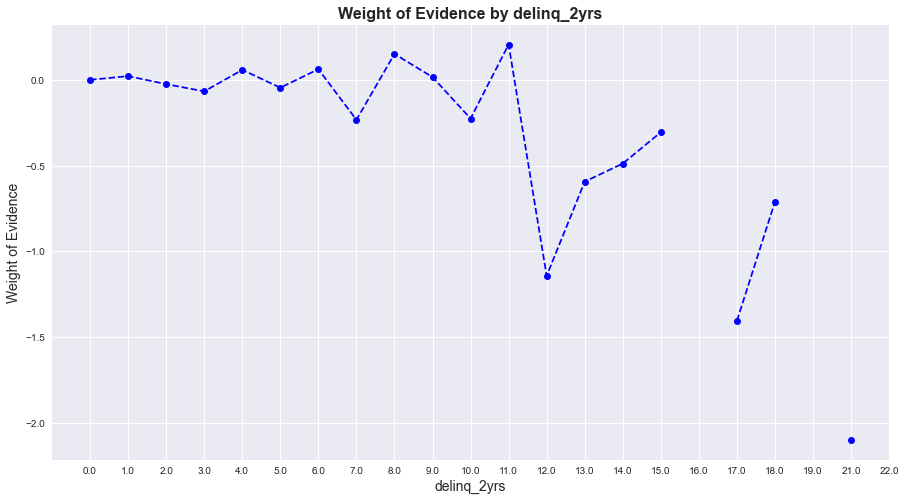

In [120]:
plot_by_woe(df_w)

In [121]:
df_pre_X['delinq_2yrs:0'] = np.where((df_pre_X['delinq_2yrs'] == 0), 1, 0)
df_pre_X['delinq_2yrs:1-3'] = np.where((df_pre_X['delinq_2yrs'] >= 1) & (df_pre_X['delinq_2yrs'] <= 3), 1, 0)
df_pre_X['delinq_2yrs:>=4'] = np.where((df_pre_X['delinq_2yrs'] >= 4), 1, 0)

__inq_last_6mths: The number of inquiries in past 6 months (excluding auto and mortgage inquiries)__

In [122]:
df_w = woe_ordered_continuous(df_pre_X, 'inq_last_6mths', df_pre_Y)
df_w

C:\Users\m10sa\anaconda3\lib\site-packages\pandas\core\arraylike.py:358: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)


,inq_last_6mths,n_obs,prop_good,prop_n_obs,n_good,n_bad,prop_n_good,prop_n_bad,WoE,IV
0,0.0,217379,0.908547,0.517993,197499.0,19880.0,0.528373,0.433408,0.198123,inf
1,1.0,117235,0.884813,0.279360,103731.0,13504.0,0.277514,0.294404,-0.059082,inf
2,2.0,51998,0.863764,0.123906,44914.0,7084.0,0.120159,0.154440,-0.250986,inf
3,3.0,22521,0.840726,0.053665,18934.0,3587.0,0.050655,0.078201,-0.434254,inf
4,4.0,6537,0.846260,0.015577,5532.0,1005.0,0.014800,0.021910,-0.392335,inf
5,5.0,2484,0.825282,0.005919,2050.0,434.0,0.005484,0.009462,-0.545346,inf
6,6.0,1083,0.786704,0.002581,852.0,231.0,0.002279,0.005036,-0.792728,inf
7,7.0,179,0.664804,0.000427,119.0,60.0,0.000318,0.001308,-1.413118,inf
8,8.0,111,0.639640,0.000265,71.0,40.0,0.000190,0.000872,-1.524096,inf
9,9.0,46,0.673913,0.000110,31.0,15.0,0.000083,0.000327,-1.371960,inf


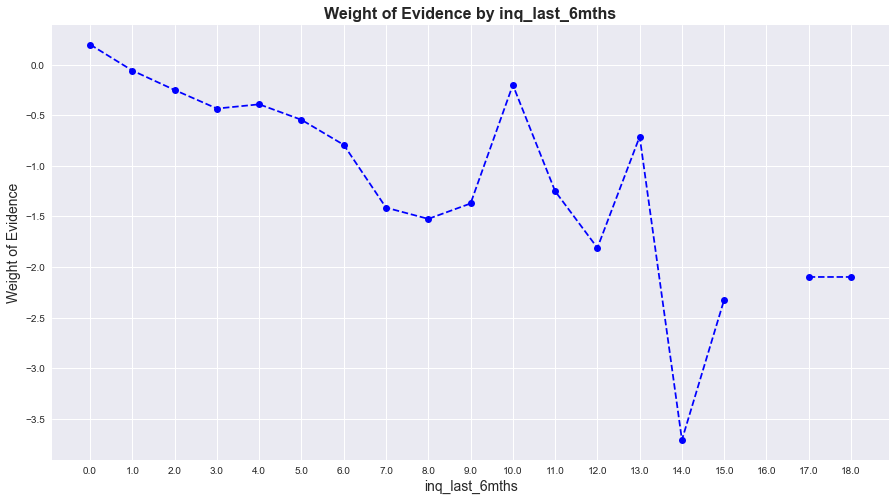

In [123]:
plot_by_woe(df_w)

In [124]:
df_pre_X['inq_last_6mths:0'] = np.where((df_pre_X['inq_last_6mths'] == 0), 1, 0)
df_pre_X['inq_last_6mths:1-2'] = np.where((df_pre_X['inq_last_6mths'].isin([1, 2])), 1, 0)
df_pre_X['inq_last_6mths:3-6'] = np.where((df_pre_X['inq_last_6mths'].isin([3, 4, 5, 6])), 1, 0)
df_pre_X['inq_last_6mths:>6'] = np.where((df_pre_X['inq_last_6mths'] > 6), 1, 0)

In [125]:
df_pre_X.loc[:, ['inq_last_6mths', 'inq_last_6mths:1-2']].head()

,inq_last_6mths,inq_last_6mths:1-2
58619,2.0,1
389825,2.0,1
119082,1.0,1
232381,0.0,0
155122,1.0,1


__open_acc: The number of open credit lines in the borrower's credit file.__

In [126]:
df_w = woe_ordered_continuous(df_pre_X, 'open_acc', df_pre_Y)
df_w

C:\Users\m10sa\anaconda3\lib\site-packages\pandas\core\arraylike.py:358: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)


,open_acc,n_obs,prop_good,prop_n_obs,n_good,n_bad,prop_n_good,prop_n_bad,WoE,IV
0,0.0,33,0.787879,0.000079,26.0,7.0,0.000070,0.000153,-0.785710,inf
1,1.0,127,0.874016,0.000303,111.0,16.0,0.000297,0.000349,-0.160955,inf
2,2.0,1607,0.844431,0.003829,1357.0,250.0,0.003630,0.005450,-0.406326,inf
3,3.0,4936,0.872771,0.011762,4308.0,628.0,0.011525,0.013691,-0.172208,inf
4,4.0,11293,0.891349,0.026910,10066.0,1227.0,0.026930,0.026750,0.006695,inf
5,5.0,19370,0.891430,0.046157,17267.0,2103.0,0.046195,0.045848,0.007536,inf
6,6.0,27717,0.892485,0.066047,24737.0,2980.0,0.066179,0.064968,0.018480,inf
7,7.0,33828,0.890564,0.080609,30126.0,3702.0,0.080597,0.080708,-0.001381,inf
8,8.0,37766,0.891225,0.089993,33658.0,4108.0,0.090046,0.089559,0.005418,inf
9,9.0,39682,0.888992,0.094558,35277.0,4405.0,0.094377,0.096034,-0.017406,inf


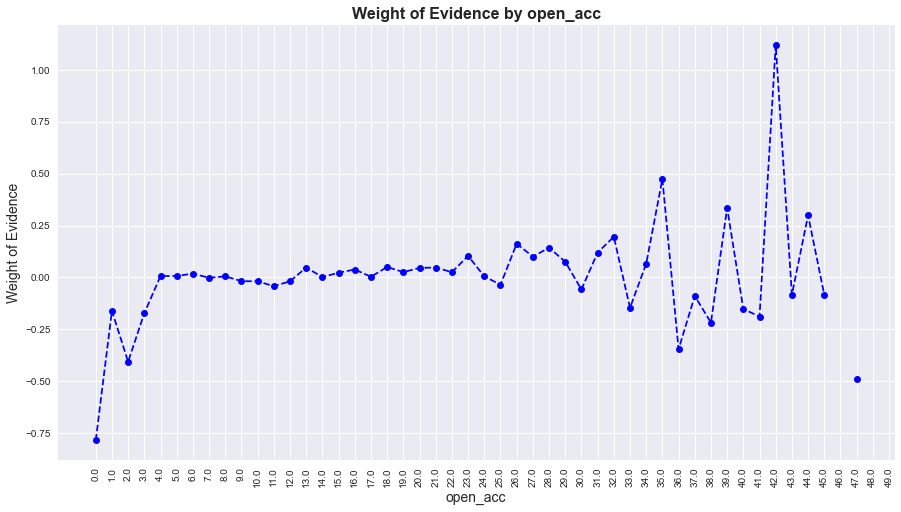

In [127]:
plot_by_woe(df_w, 90)

In [128]:
df_pre_X['open_acc:0'] = np.where(df_pre_X['open_acc'] == 0, 1, 0)
df_pre_X['open_acc:1-3'] = np.where((df_pre_X['open_acc'] >= 1) & (df_pre_X['open_acc'] <= 3), 1, 0)
df_pre_X['open_acc:4-12'] = np.where((df_pre_X['open_acc'] >= 4) & (df_pre_X['open_acc'] <= 12), 1, 0)
df_pre_X['open_acc:13-24'] = np.where((df_pre_X['open_acc'] >= 13) & (df_pre_X['open_acc'] <= 24), 1, 0)
df_pre_X['open_acc:25-32'] = np.where((df_pre_X['open_acc'] >= 25) & (df_pre_X['open_acc'] <= 32), 1, 0)
df_pre_X['open_acc:>=33'] = np.where((df_pre_X['open_acc'] >= 33), 1, 0)

__pub_rec: Number of derogatory public records__

In [129]:
df_w = woe_ordered_continuous(df_pre_X, 'pub_rec', df_pre_Y)
df_w

,pub_rec,n_obs,prop_good,prop_n_obs,n_good,n_bad,prop_n_good,prop_n_bad,WoE,IV
0,0.0,364416,0.889859,0.868368,324279.0,40137.0,0.867550,0.875035,-0.008591,inf
1,1.0,47759,0.894156,0.113805,42704.0,5055.0,0.114247,0.110205,0.036018,inf
2,2.0,5084,0.905193,0.012115,4602.0,482.0,0.012312,0.010508,0.158406,inf
3,3.0,1445,0.919723,0.003443,1329.0,116.0,0.003556,0.002529,0.340695,inf
4,4.0,455,0.907692,0.001084,413.0,42.0,0.001105,0.000916,0.187881,inf
5,5.0,246,0.910569,0.000586,224.0,22.0,0.000599,0.000480,0.222707,inf
6,6.0,125,0.928000,0.000298,116.0,9.0,0.000310,0.000196,0.458469,inf
7,7.0,53,0.943396,0.000126,50.0,3.0,0.000134,0.000065,0.715514,inf
8,8.0,25,1.000000,0.000060,25.0,0.0,0.000067,0.000000,inf,inf
9,9.0,16,0.812500,0.000038,13.0,3.0,0.000035,0.000065,-0.631560,inf


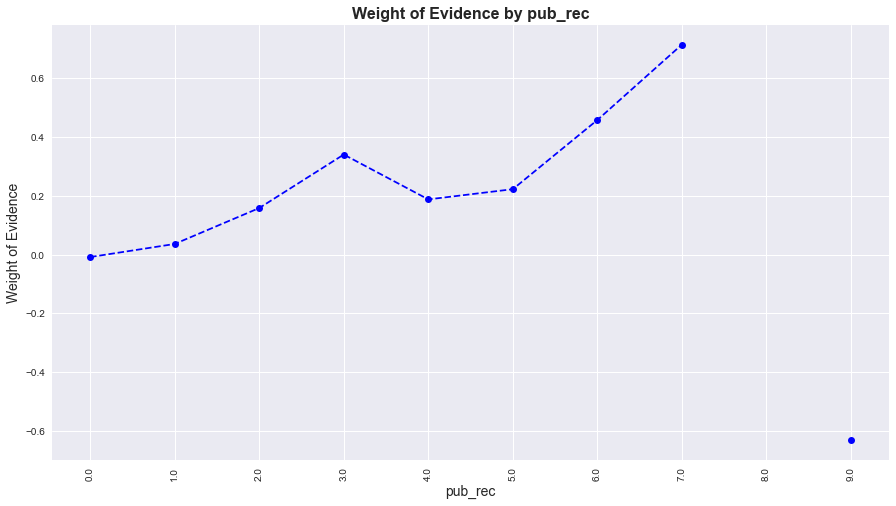

In [130]:
plot_by_woe(df_w, 90)

In [131]:
df_pre_X['pub_rec:0-2'] = np.where(df_pre_X['pub_rec'] <= 2, 1, 0)
df_pre_X['pub_rec:3-5'] = np.where((df_pre_X['pub_rec'] >= 3) & (df_pre_X['pub_rec'] <= 5), 1, 0)
df_pre_X['pub_rec:>=6'] = np.where((df_pre_X['pub_rec'] >= 6), 1, 0)

__total_acc: The total number of credit lines currently in the borrower's credit file__

In [132]:
df_pre_X['total_acc_factor'] = pd.cut(df_pre_X['total_acc'], 50)
df_w = woe_ordered_continuous(df_pre_X, 'total_acc_factor', df_pre_Y)
df_w

,total_acc_factor,n_obs,prop_good,prop_n_obs,n_good,n_bad,prop_n_good,prop_n_bad,WoE,IV
0,"(-0.15, 3.0]",524,0.809160,0.001249,424.0,100.0,0.001134,0.002180,-0.653333,inf
1,"(3.0, 6.0]",6776,0.863489,0.016147,5851.0,925.0,0.015653,0.020166,-0.253322,inf
2,"(6.0, 9.0]",16838,0.872847,0.040123,14697.0,2141.0,0.039319,0.046676,-0.171526,inf
3,"(9.0, 12.0]",28302,0.880256,0.067441,24913.0,3389.0,0.066650,0.073884,-0.103042,inf
4,"(12.0, 15.0]",37733,0.881510,0.089914,33262.0,4471.0,0.088987,0.097473,-0.091093,inf
5,"(15.0, 18.0]",43728,0.887372,0.104200,38803.0,4925.0,0.103810,0.107371,-0.033723,inf
6,"(18.0, 21.0]",45808,0.887138,0.109156,40638.0,5170.0,0.108720,0.112712,-0.036066,inf
7,"(21.0, 24.0]",45105,0.891852,0.107481,40227.0,4878.0,0.107620,0.106346,0.011907,inf
8,"(24.0, 27.0]",40838,0.895073,0.097313,36553.0,4285.0,0.097791,0.093418,0.045746,inf
9,"(27.0, 30.0]",35619,0.898397,0.084877,32000.0,3619.0,0.085610,0.078899,0.081642,inf


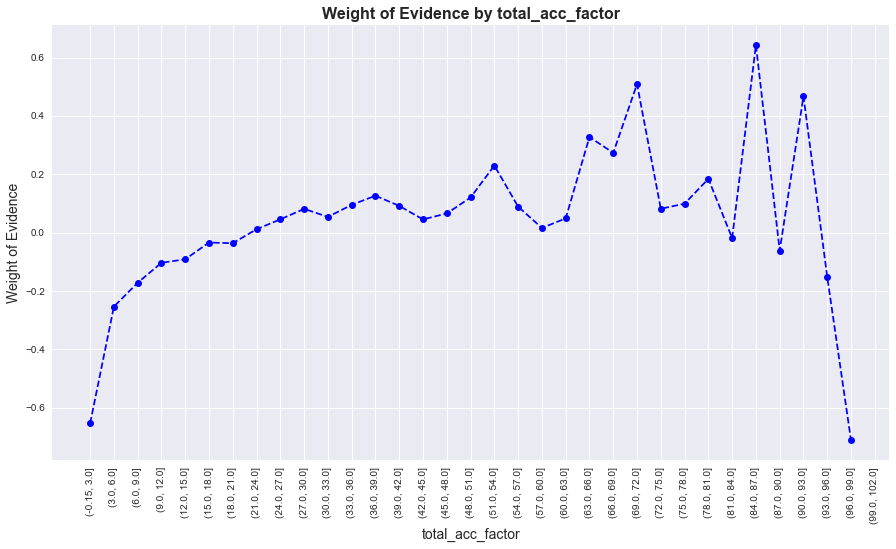

In [133]:
plot_by_woe(df_w, 90)

In [134]:
df_pre_X['total_acc:<=21'] = np.where((df_pre_X['total_acc'] <= 21), 1, 0)
df_pre_X['total_acc:22-63'] = np.where((df_pre_X['total_acc'] >= 22) & (df_pre_X['total_acc'] <= 63), 1, 0)
df_pre_X['total_acc:>=64'] = np.where((df_pre_X['total_acc'] >= 64), 1, 0)             

__acc_now_delinq: The number of accounts on which the borrower is now delinquent__

In [135]:
df_w = woe_ordered_continuous(df_pre_X, 'acc_now_delinq', df_pre_Y)
df_w

,acc_now_delinq,n_obs,prop_good,prop_n_obs,n_good,n_bad,prop_n_good,prop_n_bad,WoE,IV
0,0.0,418106,0.890681,0.996306,372399.0,45707.0,0.996287,0.996468,-0.000182,inf
1,1.0,1454,0.896149,0.003465,1303.0,151.0,0.003486,0.003292,0.057248,inf
2,2.0,81,0.901235,0.000193,73.0,8.0,0.000195,0.000174,0.113121,inf
3,3.0,9,0.777778,0.000021,7.0,2.0,0.000019,0.000044,-0.845134,inf
4,4.0,4,1.000000,0.000010,4.0,0.0,0.000011,0.000000,inf,inf
5,5.0,2,0.500000,0.000005,1.0,1.0,0.000003,0.000022,-2.097897,inf


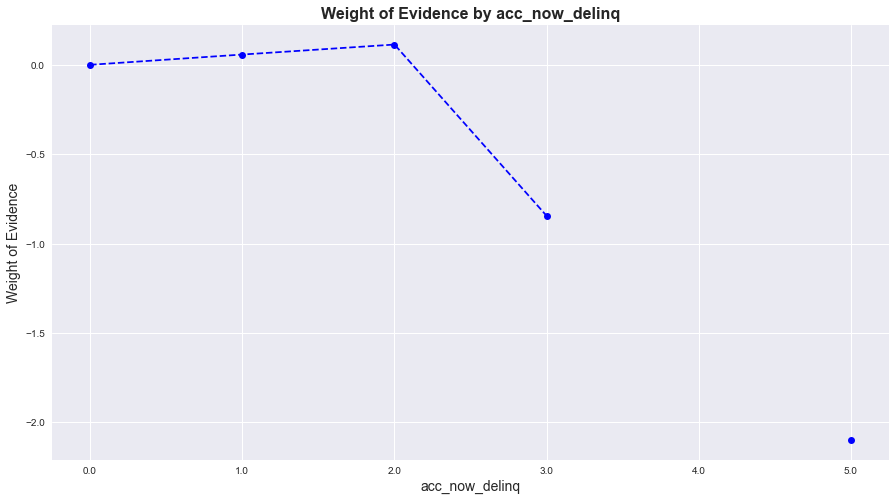

In [136]:
plot_by_woe(df_w)

In [137]:
df_pre_X['acc_now_delinq:0'] = np.where((df_pre_X['acc_now_delinq'] == 0), 1, 0)
df_pre_X['acc_now_delinq:>=1'] = np.where((df_pre_X['acc_now_delinq'] >= 1), 1, 0)

__total_rev_hi_lim: Total revolving high credit/credit limit__

In [138]:
df_pre_X['total_rev_hi_lim_factor'] = pd.cut(df_pre_X['total_rev_hi_lim'], 2000)
df_w = woe_ordered_continuous(df_pre_X, 'total_rev_hi_lim_factor', df_pre_Y)
df_w

C:\Users\m10sa\anaconda3\lib\site-packages\pandas\core\arraylike.py:358: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)


,total_rev_hi_lim_factor,n_obs,prop_good,prop_n_obs,n_good,n_bad,prop_n_good,prop_n_bad,WoE,IV
0,"(-9999.999, 5000.0]",21881,0.866048,0.052140,18950.0,2931.0,0.050697,0.063899,-0.231436,inf
1,"(5000.0, 9999.999]",59273,0.875744,0.141242,51908.0,7365.0,0.138871,0.160566,-0.145163,inf
2,"(9999.999, 14999.998]",66934,0.880509,0.159497,58936.0,7998.0,0.157673,0.174366,-0.100636,inf
3,"(14999.998, 19999.998]",57840,0.877006,0.137827,50726.0,7114.0,0.135708,0.155094,-0.133523,inf
4,"(19999.998, 24999.997]",46782,0.885875,0.111477,41443.0,5339.0,0.110873,0.116397,-0.048616,inf
5,"(24999.997, 29999.997]",36155,0.890167,0.086154,32184.0,3971.0,0.086103,0.086573,-0.005445,inf
6,"(29999.997, 34999.996]",27557,0.895526,0.065666,24678.0,2879.0,0.066022,0.062766,0.050573,inf
7,"(34999.996, 39999.996]",22215,0.902903,0.052936,20058.0,2157.0,0.053662,0.047025,0.132013,inf
8,"(39999.996, 44999.996]",16577,0.914158,0.039501,15154.0,1423.0,0.040542,0.031023,0.267601,inf
9,"(44999.996, 49999.995]",13036,0.912703,0.031064,11898.0,1138.0,0.031831,0.024810,0.249201,inf


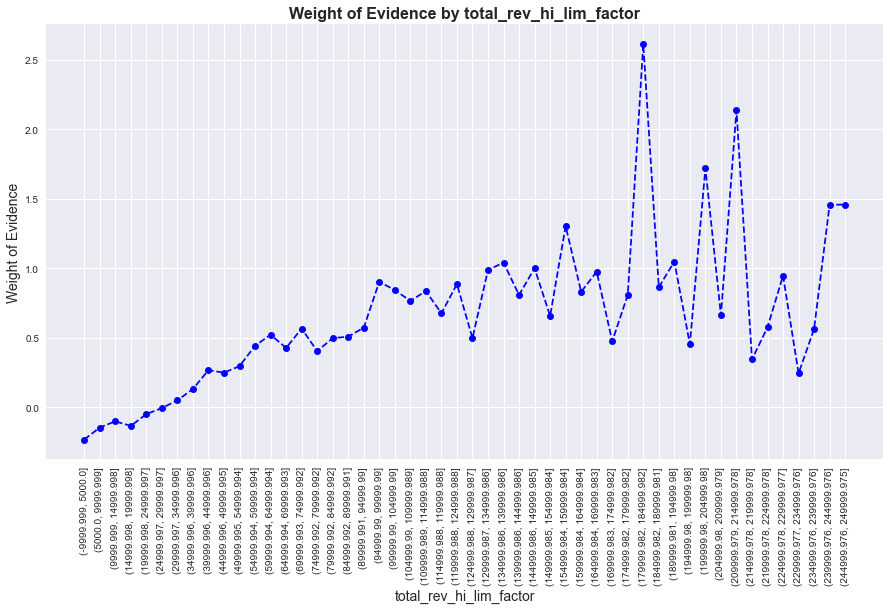

In [139]:
plot_by_woe(df_w.iloc[:50, :], 90)

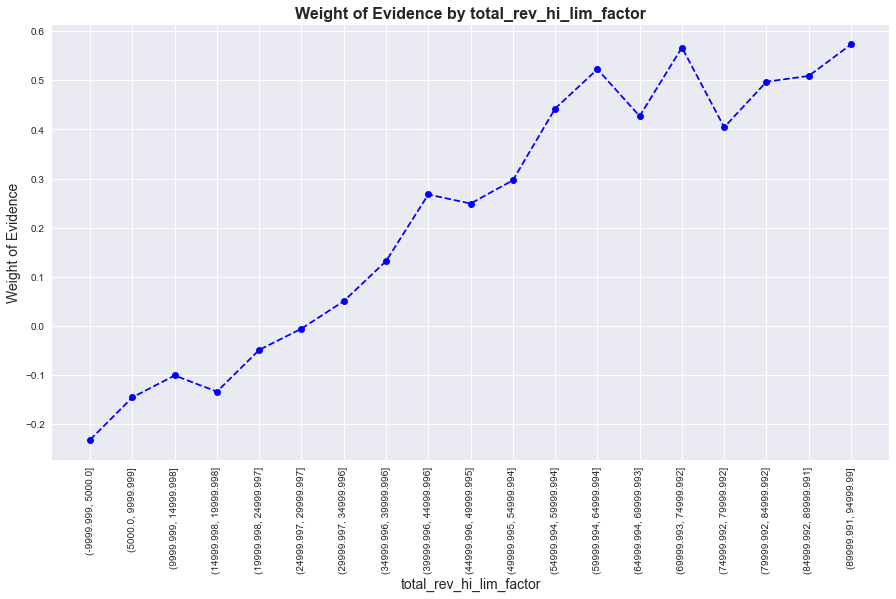

In [140]:
plot_by_woe(df_w.iloc[:19, :], 90)

In [141]:
df_pre_X['total_rev_hi_lim:<=5K'] = np.where((df_pre_X['total_rev_hi_lim'] <= 5000), 1, 0)
df_pre_X['total_rev_hi_lim:5K-10K'] = np.where((df_pre_X['total_rev_hi_lim'] > 5000) & (df_pre_X['total_rev_hi_lim'] <= 10000), 1, 0)
df_pre_X['total_rev_hi_lim:10K-20K'] = np.where((df_pre_X['total_rev_hi_lim'] > 10000) & (df_pre_X['total_rev_hi_lim'] <= 20000), 1, 0)
df_pre_X['total_rev_hi_lim:20K-30K'] = np.where((df_pre_X['total_rev_hi_lim'] > 20000) & (df_pre_X['total_rev_hi_lim'] <= 30000), 1, 0)
df_pre_X['total_rev_hi_lim:30K-40K'] = np.where((df_pre_X['total_rev_hi_lim'] > 30000) & (df_pre_X['total_rev_hi_lim'] <= 40000), 1, 0)
df_pre_X['total_rev_hi_lim:40K-55K'] = np.where((df_pre_X['total_rev_hi_lim'] > 40000) & (df_pre_X['total_rev_hi_lim'] <= 55000), 1, 0)
df_pre_X['total_rev_hi_lim:55K-95K'] = np.where((df_pre_X['total_rev_hi_lim'] > 55000) & (df_pre_X['total_rev_hi_lim'] <= 95000), 1, 0)
df_pre_X['total_rev_hi_lim:>95K'] = np.where((df_pre_X['total_rev_hi_lim'] > 95000), 1, 0)

__installment: The monthly payment owed by the borrower if the loan originates__

In [142]:
df_pre_X['installment_factor'] = pd.cut(df_pre_X['installment'], 50)
df_w = woe_ordered_continuous(df_pre_X, 'installment_factor', df_pre_Y)
df_w

,installment_factor,n_obs,prop_good,prop_n_obs,n_good,n_bad,prop_n_good,prop_n_bad,WoE,IV
0,"(14.276, 43.556]",2051,0.900049,0.004887,1846.0,205.0,0.004939,0.004469,0.099870,0.013328
1,"(43.556, 71.443]",5448,0.897761,0.012982,4891.0,557.0,0.013085,0.012143,0.074690,0.013328
2,"(71.443, 99.329]",7709,0.892853,0.018370,6883.0,826.0,0.018414,0.018008,0.022319,0.013328
3,"(99.329, 127.216]",10259,0.891412,0.024446,9145.0,1114.0,0.024466,0.024287,0.007354,0.013328
4,"(127.216, 155.102]",11342,0.894022,0.027027,10140.0,1202.0,0.027128,0.026205,0.034605,0.013328
5,"(155.102, 182.988]",18851,0.894170,0.044920,16856.0,1995.0,0.045095,0.043493,0.036166,0.013328
6,"(182.988, 210.875]",19259,0.905966,0.045892,17448.0,1811.0,0.046679,0.039482,0.167449,0.013328
7,"(210.875, 238.761]",16926,0.900508,0.040333,15242.0,1684.0,0.040777,0.036713,0.104986,0.013328
8,"(238.761, 266.648]",21163,0.901195,0.050429,19072.0,2091.0,0.051024,0.045586,0.112682,0.013328
9,"(266.648, 294.534]",22612,0.891606,0.053882,20161.0,2451.0,0.053937,0.053435,0.009357,0.013328


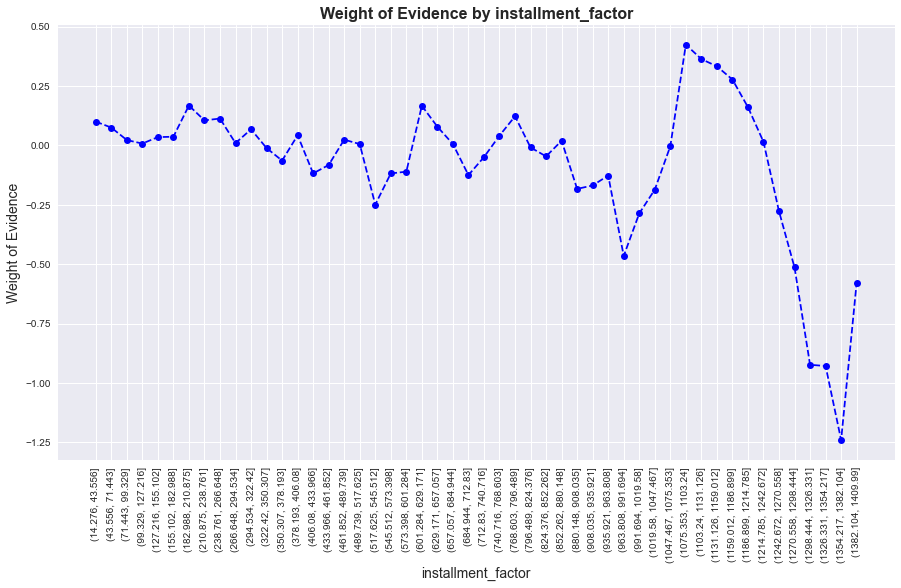

In [143]:
plot_by_woe(df_w, 90)

We don not create dummy variables for the 'installment' variable.

__annual_inc: The self-reported annual income provided by the borrower during registration__

In [144]:
df_pre_X['annual_inc_factor'] = pd.cut(df_pre_X['annual_inc'], 50)
df_w = woe_ordered_continuous(df_pre_X, 'annual_inc_factor', df_pre_Y)
df_w

,annual_inc_factor,n_obs,prop_good,prop_n_obs,n_good,n_bad,prop_n_good,prop_n_bad,WoE,IV
0,"(-5602.104, 151858.08]",401297,0.888997,0.956252,356752.0,44545.0,0.954426,0.971135,-0.017356,inf
1,"(151858.08, 301820.16]",16549,0.927126,0.039435,15343.0,1206.0,0.041047,0.026292,0.445454,inf
2,"(301820.16, 451782.24]",1226,0.935563,0.002921,1147.0,79.0,0.003069,0.001722,0.577561,inf
3,"(451782.24, 601744.32]",329,0.942249,0.000784,310.0,19.0,0.000829,0.000414,0.694237,inf
4,"(601744.32, 751706.4]",106,0.896226,0.000253,95.0,11.0,0.000254,0.000240,0.058085,inf
5,"(751706.4, 901668.48]",65,0.892308,0.000155,58.0,7.0,0.000155,0.000153,0.016636,inf
6,"(901668.48, 1051630.56]",31,0.967742,0.000074,30.0,1.0,0.000080,0.000022,1.303301,inf
7,"(1051630.56, 1201592.64]",20,1.000000,0.000048,20.0,0.0,0.000054,0.000000,inf,inf
8,"(1201592.64, 1351554.72]",10,0.900000,0.000024,9.0,1.0,0.000024,0.000022,0.099328,inf
9,"(1351554.72, 1501516.8]",4,1.000000,0.000010,4.0,0.0,0.000011,0.000000,inf,inf


In [145]:
df_pre_X['annual_inc_factor'] = pd.cut(df_pre_X['annual_inc'], 100)
df_w = woe_ordered_continuous(df_pre_X, 'annual_inc_factor', df_pre_Y)
df_w

,annual_inc_factor,n_obs,prop_good,prop_n_obs,n_good,n_bad,prop_n_good,prop_n_bad,WoE,IV
0,"(-5602.104, 76877.04]",275768,0.877179,0.657129,241898.0,33870.0,0.647155,0.738407,-0.131910,inf
1,"(76877.04, 151858.08]",125529,0.914960,0.299124,114854.0,10675.0,0.307271,0.232728,0.277861,inf
2,"(151858.08, 226839.12]",13335,0.927334,0.031776,12366.0,969.0,0.033083,0.021125,0.448545,inf
3,"(226839.12, 301820.16]",3214,0.926260,0.007659,2977.0,237.0,0.007964,0.005167,0.432715,inf
4,"(301820.16, 376801.2]",781,0.930858,0.001861,727.0,54.0,0.001945,0.001177,0.502046,inf
5,"(376801.2, 451782.24]",445,0.943820,0.001060,420.0,25.0,0.001124,0.000545,0.723482,inf
6,"(451782.24, 526763.28]",204,0.955882,0.000486,195.0,9.0,0.000522,0.000196,0.977878,inf
7,"(526763.28, 601744.32]",125,0.920000,0.000298,115.0,10.0,0.000308,0.000218,0.344450,inf
8,"(601744.32, 676725.36]",52,0.884615,0.000124,46.0,6.0,0.000123,0.000131,-0.061015,inf
9,"(676725.36, 751706.4]",54,0.907407,0.000129,49.0,5.0,0.000131,0.000109,0.184486,inf


In [146]:
df_pre_X_temp = df_pre_X.loc[df_pre_X['annual_inc'] < 150000] 
df_pre_X_temp.head()

,id,member_id,loan_amnt,funded_amnt,funded_amnt_inv,term,int_rate,installment,grade,sub_grade,emp_title,emp_length,home_ownership,annual_inc,verification_status,issue_d,loan_status,pymnt_plan,url,desc,purpose,title,zip_code,addr_state,dti,delinq_2yrs,earliest_cr_line,inq_last_6mths,mths_since_last_delinq,mths_since_last_record,open_acc,pub_rec,revol_bal,revol_util,total_acc,initial_list_status,out_prncp,out_prncp_inv,total_pymnt,total_pymnt_inv,total_rec_prncp,total_rec_int,total_rec_late_fee,recoveries,collection_recovery_fee,last_pymnt_d,last_pymnt_amnt,next_pymnt_d,last_credit_pull_d,collections_12_mths_ex_med,mths_since_last_major_derog,policy_code,application_type,annual_inc_joint,dti_joint,verification_status_joint,acc_now_delinq,tot_coll_amt,tot_cur_bal,open_acc_6m,open_il_6m,open_il_12m,open_il_24m,mths_since_rcnt_il,total_bal_il,il_util,open_rv_12m,open_rv_24m,max_bal_bc,all_util,total_rev_hi_lim,inq_fi,total_cu_tl,inq_last_12m,emp_length_int,earliest_cr_line_date,mths_since_earliest_cr_line,term_int,issue_d_date,mths_since_issue_d,addr_state:AK,addr_state:AL,addr_state:AR,addr_state:AZ,addr_state:CA,addr_state:CO,addr_state:CT,addr_state:DC,addr_state:DE,addr_state:FL,addr_state:GA,addr_state:HI,addr_state:IA,addr_state:ID,addr_state:IL,addr_state:IN,addr_state:KS,addr_state:KY,addr_state:LA,addr_state:MA,addr_state:MD,addr_state:ME,addr_state:MI,addr_state:MN,addr_state:MO,addr_state:MS,addr_state:MT,addr_state:NC,addr_state:NE,addr_state:NH,addr_state:NJ,addr_state:NM,addr_state:NV,addr_state:NY,addr_state:OH,addr_state:OK,addr_state:OR,addr_state:PA,addr_state:RI,addr_state:SC,addr_state:SD,addr_state:TN,addr_state:TX,addr_state:UT,addr_state:VA,addr_state:VT,addr_state:WA,addr_state:WI,addr_state:WV,addr_state:WY,grade:A,grade:B,grade:C,grade:D,grade:E,grade:F,grade:G,home_ownership:ANY,home_ownership:MORTGAGE,home_ownership:NONE,home_ownership:OTHER,home_ownership:OWN,home_ownership:RENT,initial_list_status:f,initial_list_status:w,loan_status:Charged Off,loan_status:Current,loan_status:Default,loan_status:Does not meet the credit policy. Status:Charged Off,loan_status:Does not meet the credit policy. Status:Fully Paid,loan_status:Fully Paid,loan_status:In Grace Period,loan_status:Late (16-30 days),loan_status:Late (31-120 days),purpose:car,purpose:credit_card,purpose:debt_consolidation,purpose:educational,purpose:home_improvement,purpose:house,purpose:major_purchase,purpose:medical,purpose:moving,purpose:other,purpose:renewable_energy,purpose:small_business,purpose:vacation,purpose:wedding,sub_grade:A1,sub_grade:A2,sub_grade:A3,sub_grade:A4,sub_grade:A5,sub_grade:B1,sub_grade:B2,sub_grade:B3,sub_grade:B4,sub_grade:B5,sub_grade:C1,sub_grade:C2,sub_grade:C3,sub_grade:C4,sub_grade:C5,sub_grade:D1,sub_grade:D2,sub_grade:D3,sub_grade:D4,sub_grade:D5,sub_grade:E1,sub_grade:E2,sub_grade:E3,sub_grade:E4,sub_grade:E5,sub_grade:F1,sub_grade:F2,sub_grade:F3,sub_grade:F4,sub_grade:F5,sub_grade:G1,sub_grade:G2,sub_grade:G3,sub_grade:G4,sub_grade:G5,verification_status:Not Verified,verification_status:Source Verified,verification_status:Verified,home_ownership:OTHER_NONE_RENT_ANY,addr_state:ND,addr_state:ND_NE_IA_NV_FL_HI_AL,addr_state:NM_VA,addr_state:OK_TN_MO_LA_MD_NC,addr_state:UT_KY_AZ_NJ,addr_state:AR_MI_PA_OH_MN,addr_state:RI_MA_DE_SD_IN,addr_state:GA_WA_OR,addr_state:WI_MT,addr_state:IL_CT,addr_state:KS_SC_CO_VT_AK_MS,addr_state:WV_NH_WY_DC_ME_ID,purpose:sm_b__edu__mov__ren_en__house__oth,purpose:med__wed__vacation,purpose:home_impr__major_purch__car,term:36,term:60,emp_length:0,emp_length:1,emp_length:2-4,emp_length:5-6,emp_length:7-9,emp_length:10,mths_since_issue_d_factor,mths_since_issue_d:<104,mths_since_issue_d:104-105,mths_since_issue_d:105-110,mths_since_issue_d:110-114,mths_since_issue_d:114-125,mths_since_issue_d:125-134,mths_since_issue_d:134-153,mths_since_issue_d:153-170,mths_since_issue_d:170-186,mths_since_issue_d:>=186,int_rate_factor,int_rate:<=9.548,int_rate:9.548-12.025,int_rate:12.025-15.74,int_rate

In [147]:
df_pre_X_temp.index

Int64Index([389825, 119082, 232381, 155122, 446563,   6739, 185068, 384618,
            321363, 178505,
            ...
            137337,  54886, 207892, 110268, 119879, 259178, 365838, 131932,
            146867, 121958],
           dtype='int64', length=397667)

In [148]:
df_pre_X_temp['annual_inc_factor'] = pd.cut(df_pre_X_temp['annual_inc'], 50)
df_w = woe_ordered_continuous(df_pre_X_temp, 'annual_inc_factor', df_pre_Y[df_pre_X_temp.index])
df_w  

<ipython-input-148-d08d1bbe06e7>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_pre_X_temp['annual_inc_factor'] = pd.cut(df_pre_X_temp['annual_inc'], 50)


,annual_inc_factor,n_obs,prop_good,prop_n_obs,n_good,n_bad,prop_n_good,prop_n_bad,WoE,IV
0,"(1747.903, 4857.94]",22,0.772727,0.000055,17.0,5.0,0.000048,0.000113,-0.854120,0.051907
1,"(4857.94, 7819.88]",49,0.816327,0.000123,40.0,9.0,0.000113,0.000203,-0.586240,0.051907
2,"(7819.88, 10781.82]",399,0.847118,0.001003,338.0,61.0,0.000956,0.001379,-0.365723,0.051907
3,"(10781.82, 13743.76]",790,0.830380,0.001987,656.0,134.0,0.001856,0.003029,-0.489574,0.051907
4,"(13743.76, 16705.7]",1560,0.844231,0.003923,1317.0,243.0,0.003726,0.005492,-0.387845,0.051907
5,"(16705.7, 19667.64]",2123,0.844560,0.005339,1793.0,330.0,0.005073,0.007458,-0.385342,0.051907
6,"(19667.64, 22629.58]",3989,0.844573,0.010031,3369.0,620.0,0.009533,0.014013,-0.385243,0.051907
7,"(22629.58, 25591.52]",7144,0.853024,0.017965,6094.0,1050.0,0.017243,0.023731,-0.319380,0.051907
8,"(25591.52, 28553.46]",6469,0.849590,0.016267,5496.0,973.0,0.015551,0.021991,-0.346503,0.051907
9,"(28553.46, 31515.4]",11600,0.860431,0.029170,9981.0,1619.0,0.028241,0.036591,-0.259020,0.051907


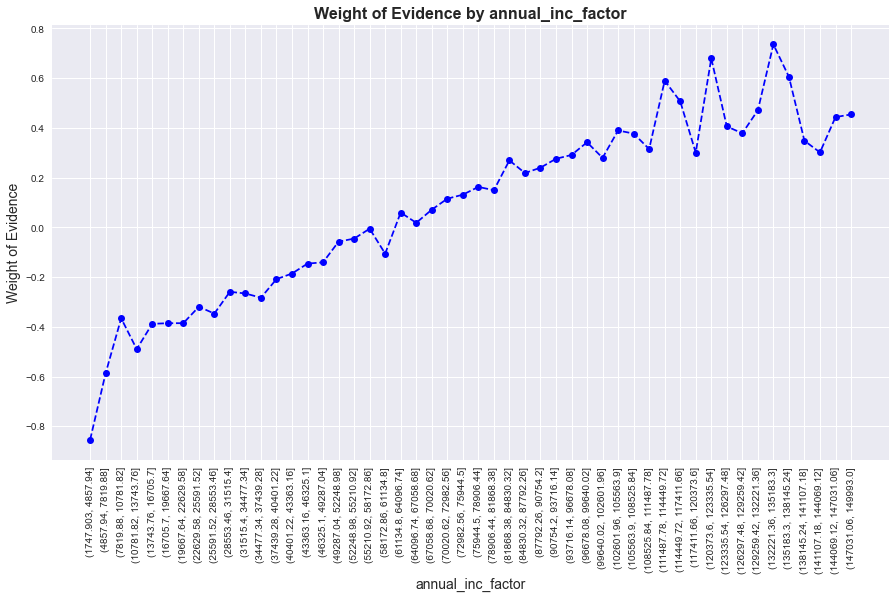

In [149]:
plot_by_woe(df_w, 90)

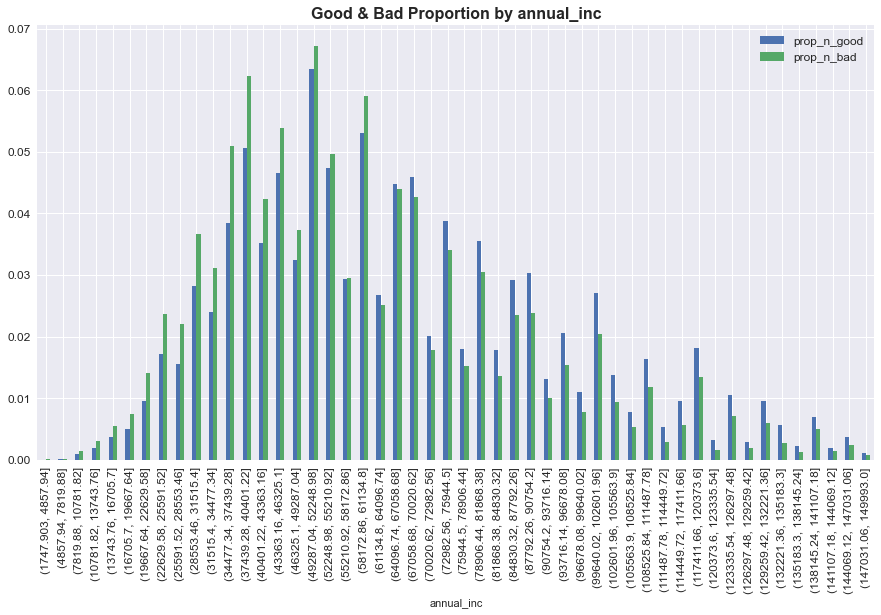

In [150]:
df_w.set_index(['annual_inc_factor'])
df_w.set_index(['annual_inc_factor'])[['prop_n_good', 'prop_n_bad']].plot(kind='bar', figsize=(15,8), fontsize=12)
plt.title('Good & Bad Proportion by annual_inc', fontdict={'fontweight':'bold', 'fontsize':16})
plt.xlabel('annual_inc')
plt.legend(fontsize=12)
plt.show()

In [151]:
df_pre_X['annual_inc:<20K'] = np.where((df_pre_X['annual_inc'] <= 20000), 1, 0)
df_pre_X['annual_inc:20K-30K'] = np.where((df_pre_X['annual_inc'] > 20000) & (df_pre_X['annual_inc'] <= 30000), 1, 0)
df_pre_X['annual_inc:30K-40K'] = np.where((df_pre_X['annual_inc'] > 30000) & (df_pre_X['annual_inc'] <= 40000), 1, 0)
df_pre_X['annual_inc:40K-50K'] = np.where((df_pre_X['annual_inc'] > 40000) & (df_pre_X['annual_inc'] <= 50000), 1, 0)
df_pre_X['annual_inc:50K-60K'] = np.where((df_pre_X['annual_inc'] > 50000) & (df_pre_X['annual_inc'] <= 60000), 1, 0)
df_pre_X['annual_inc:60K-70K'] = np.where((df_pre_X['annual_inc'] > 60000) & (df_pre_X['annual_inc'] <= 70000), 1, 0)
df_pre_X['annual_inc:70K-80K'] = np.where((df_pre_X['annual_inc'] > 70000) & (df_pre_X['annual_inc'] <= 80000), 1, 0)
df_pre_X['annual_inc:80K-90K'] = np.where((df_pre_X['annual_inc'] > 80000) & (df_pre_X['annual_inc'] <= 90000), 1, 0)
df_pre_X['annual_inc:90K-100K'] = np.where((df_pre_X['annual_inc'] > 90000) & (df_pre_X['annual_inc'] <= 100000), 1, 0)
df_pre_X['annual_inc:100K-120K'] = np.where((df_pre_X['annual_inc'] > 100000) & (df_pre_X['annual_inc'] <= 120000), 1, 0)
df_pre_X['annual_inc:120K-150K'] = np.where((df_pre_X['annual_inc'] > 120000) & (df_pre_X['annual_inc'] <= 150000), 1, 0)
df_pre_X['annual_inc:>150K'] = np.where((df_pre_X['annual_inc'] > 151000), 1, 0)

__mths_since_last_delinq:the number of months since the borrower's last delinquency__

In [152]:
pd.isnull(df_pre_X['mths_since_last_delinq']).sum()         

225332

In [153]:
df_pre_X_temp = df_pre_X[pd.notnull(df_pre_X['mths_since_last_delinq'])]
df_pre_X_temp['mths_since_last_delinq_factor'] = pd.cut(df_pre_X_temp['mths_since_last_delinq'], 50)
df_w = woe_ordered_continuous(df_pre_X_temp, 'mths_since_last_delinq_factor', df_pre_Y[df_pre_X_temp.index])
df_w

<ipython-input-153-6ecf15293517>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_pre_X_temp['mths_since_last_delinq_factor'] = pd.cut(df_pre_X_temp['mths_since_last_delinq'], 50)


,mths_since_last_delinq_factor,n_obs,prop_good,prop_n_obs,n_good,n_bad,prop_n_good,prop_n_bad,WoE,IV
0,"(-0.188, 3.76]",5960,0.870805,0.030670,5190.0,770.0,0.029928,0.036832,-0.207570,inf
1,"(3.76, 7.52]",12531,0.886202,0.064485,11105.0,1426.0,0.064036,0.068210,-0.063147,inf
2,"(7.52, 11.28]",15006,0.892976,0.077222,13400.0,1606.0,0.077270,0.076820,0.005839,inf
3,"(11.28, 15.04]",14874,0.888127,0.076542,13210.0,1664.0,0.076174,0.079594,-0.043919,inf
4,"(15.04, 18.8]",10466,0.893751,0.053859,9354.0,1112.0,0.053939,0.053190,0.013975,inf
5,"(18.8, 22.56]",13080,0.892890,0.067310,11679.0,1401.0,0.067346,0.067014,0.004937,inf
6,"(22.56, 26.32]",12260,0.897145,0.063091,10999.0,1261.0,0.063425,0.060318,0.050231,inf
7,"(26.32, 30.08]",11885,0.895835,0.061161,10647.0,1238.0,0.061395,0.059217,0.036112,inf
8,"(30.08, 33.84]",8492,0.900612,0.043700,7648.0,844.0,0.044102,0.040371,0.088378,inf
9,"(33.84, 37.6]",11031,0.898559,0.056766,9912.0,1119.0,0.057157,0.053525,0.065642,inf


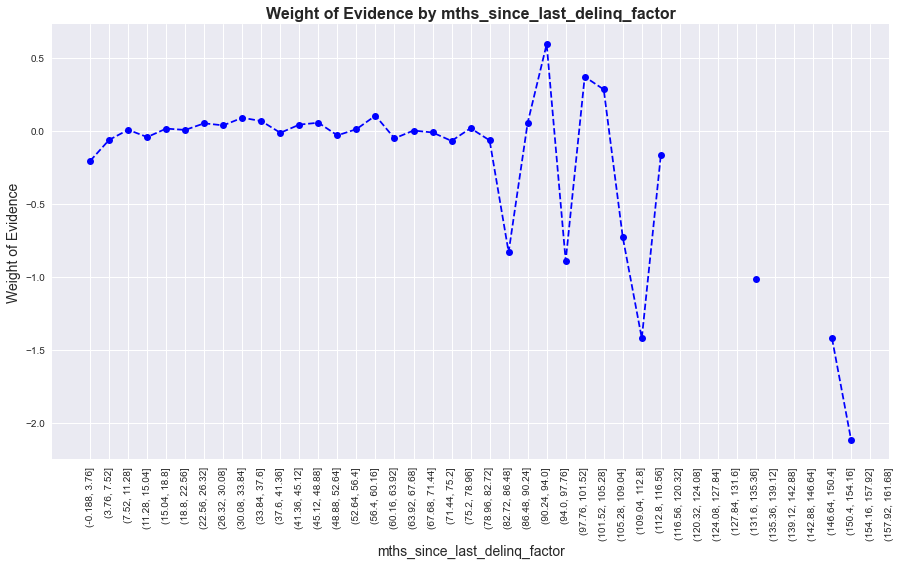

In [154]:
plot_by_woe(df_w, 90)

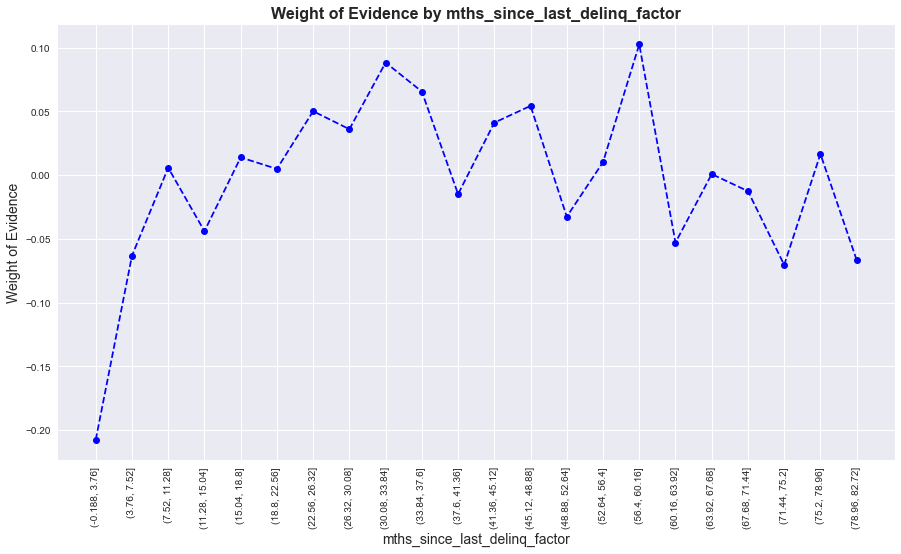

In [155]:
plot_by_woe(df_w.iloc[:22, :], 90)

In [156]:
df_pre_X['mths_since_last_delinq:Missing'] = np.where((df_pre_X['mths_since_last_delinq'].isnull()), 1, 0)
df_pre_X['mths_since_last_delinq:0-3'] = np.where((df_pre_X['mths_since_last_delinq'] >= 0) & (df_pre_X['mths_since_last_delinq'] <= 3), 1, 0)
df_pre_X['mths_since_last_delinq:4-22'] = np.where((df_pre_X['mths_since_last_delinq'] >= 4) & (df_pre_X['mths_since_last_delinq'] <= 22), 1, 0)
df_pre_X['mths_since_last_delinq:23-37'] = np.where((df_pre_X['mths_since_last_delinq'] >= 23) & (df_pre_X['mths_since_last_delinq'] <= 37), 1, 0)
df_pre_X['mths_since_last_delinq:38-56'] = np.where((df_pre_X['mths_since_last_delinq'] >= 38) & (df_pre_X['mths_since_last_delinq'] <= 56), 1, 0)
df_pre_X['mths_since_last_delinq:57-60'] = np.where((df_pre_X['mths_since_last_delinq'] >= 57) & (df_pre_X['mths_since_last_delinq'] <= 60), 1, 0)
df_pre_X['mths_since_last_delinq:61-82'] = np.where((df_pre_X['mths_since_last_delinq'] >= 61) & (df_pre_X['mths_since_last_delinq'] <= 82), 1, 0)
df_pre_X['mths_since_last_delinq:>=83'] = np.where((df_pre_X['mths_since_last_delinq'] >= 83), 1, 0)  

__dti: a ratio calculated using the borrower’s total monthly debt payments on the total debt obligations, excluding mortgage and the requested LC loan, divided by the borrower’s self-reported monthly income.__

In [157]:
df_pre_X['dti_factor'] = pd.cut(df_pre_X['dti'], 100)
df_w = woe_ordered_continuous(df_pre_X, 'dti_factor', df_pre_Y)
df_w

,dti_factor,n_obs,prop_good,prop_n_obs,n_good,n_bad,prop_n_good,prop_n_bad,WoE,IV
0,"(-0.04, 0.4]",836,0.875598,0.001992,732.0,104.0,0.001958,0.002267,-0.146507,0.028508
1,"(0.4, 0.8]",898,0.913140,0.002140,820.0,78.0,0.002194,0.001700,0.254699,0.028508
2,"(0.8, 1.2]",1029,0.898931,0.002452,925.0,104.0,0.002475,0.002267,0.087506,0.028508
3,"(1.2, 1.6]",1164,0.895189,0.002774,1042.0,122.0,0.002788,0.002660,0.046980,0.028508
4,"(1.6, 2.0]",1313,0.904037,0.003129,1187.0,126.0,0.003176,0.002747,0.145006,0.028508
5,"(2.0, 2.399]",1502,0.919441,0.003579,1381.0,121.0,0.003695,0.002638,0.336876,0.028508
6,"(2.399, 2.799]",1710,0.918129,0.004075,1570.0,140.0,0.004200,0.003052,0.319292,0.028508
7,"(2.799, 3.199]",1920,0.902083,0.004575,1732.0,188.0,0.004634,0.004099,0.122694,0.028508
8,"(3.199, 3.599]",2166,0.904432,0.005161,1959.0,207.0,0.005241,0.004513,0.149574,0.028508
9,"(3.599, 3.999]",2480,0.915323,0.005910,2270.0,210.0,0.006073,0.004578,0.282531,0.028508


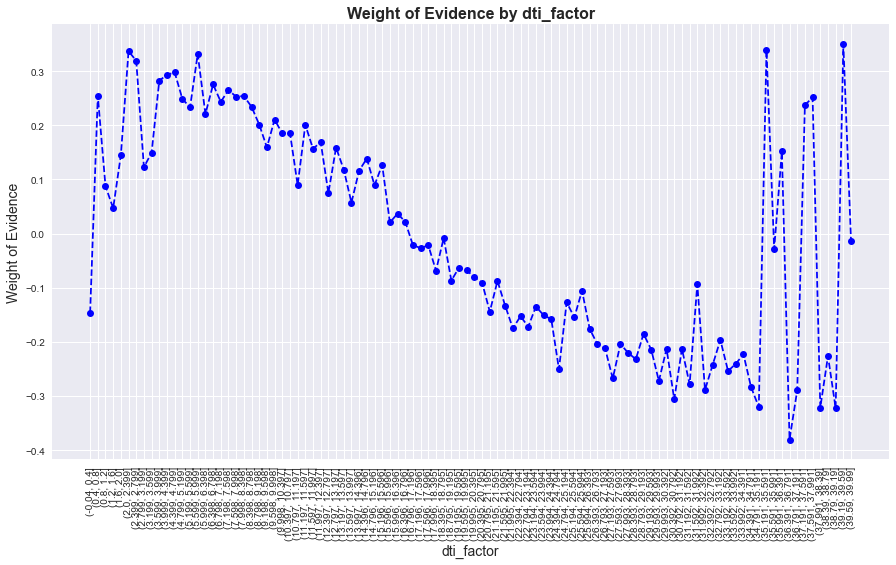

In [158]:
plot_by_woe(df_w, 90)

In [159]:
df_pre_X_temp = df_pre_X.loc[df_pre_X['dti'] <= 35, :]

In [160]:
df_pre_X_temp['dti_factor'] = pd.cut(df_pre_X_temp['dti'], 50)
df_w = woe_ordered_continuous(df_pre_X_temp, 'dti_factor', df_pre_Y[df_pre_X_temp.index])
df_w

<ipython-input-160-eb0beb527a33>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_pre_X_temp['dti_factor'] = pd.cut(df_pre_X_temp['dti'], 50)


,dti_factor,n_obs,prop_good,prop_n_obs,n_good,n_bad,prop_n_good,prop_n_bad,WoE,IV
0,"(-0.035, 0.7]",1527,0.891290,0.003667,1361.0,166.0,0.003669,0.003648,0.005793,0.027413
1,"(0.7, 1.4]",1846,0.894366,0.004433,1651.0,195.0,0.004451,0.004285,0.037943,0.027413
2,"(1.4, 2.1]",2233,0.912226,0.005362,2037.0,196.0,0.005492,0.004307,0.242924,0.027413
3,"(2.1, 2.8]",2897,0.915430,0.006957,2652.0,245.0,0.007150,0.005384,0.283617,0.027413
4,"(2.8, 3.5]",3552,0.904561,0.008530,3213.0,339.0,0.008662,0.007450,0.150766,0.027413
5,"(3.5, 4.2]",4320,0.915278,0.010374,3954.0,366.0,0.010660,0.008043,0.281655,0.027413
6,"(4.2, 4.9]",5151,0.913027,0.012370,4703.0,448.0,0.012679,0.009845,0.252968,0.027413
7,"(4.9, 5.6]",5981,0.913392,0.014363,5463.0,518.0,0.014728,0.011384,0.257584,0.027413
8,"(5.6, 6.3]",6655,0.914500,0.015981,6086.0,569.0,0.016408,0.012504,0.271672,0.027413
9,"(6.3, 7.0]",7346,0.912878,0.017641,6706.0,640.0,0.018079,0.014065,0.251095,0.027413


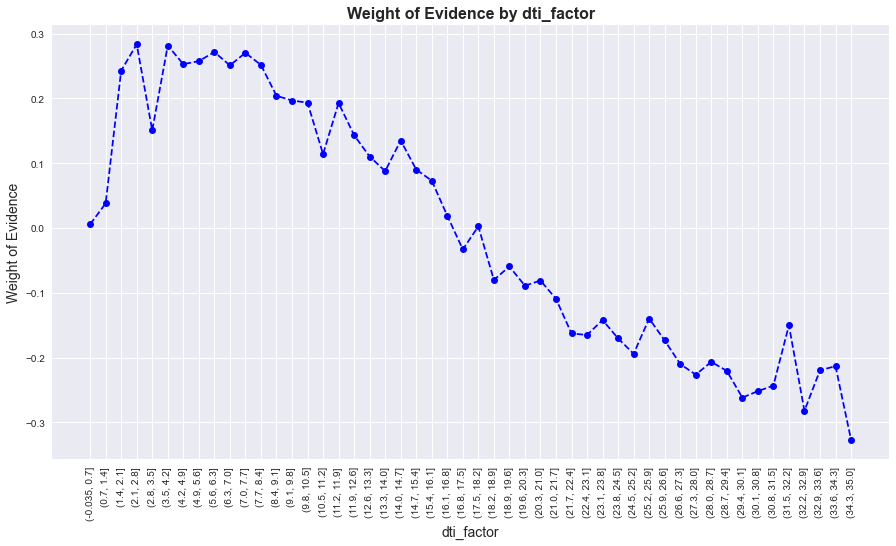

In [161]:
plot_by_woe(df_w, 90)

In [162]:
df_pre_X['dti:<=1.4'] = np.where((df_pre_X['dti'] <= 1.4), 1, 0)
df_pre_X['dti:1.4-3.5'] = np.where((df_pre_X['dti'] > 1.4) & (df_pre_X['dti'] <= 3.5), 1, 0)
df_pre_X['dti:3.5-8.4'] = np.where((df_pre_X['dti'] > 3.5) & (df_pre_X['dti'] <= 8.4), 1, 0)
df_pre_X['dti:8.4-10.5'] = np.where((df_pre_X['dti'] > 8.4) & (df_pre_X['dti'] <= 10.5), 1, 0)
df_pre_X['dti:10.5-15.4'] = np.where((df_pre_X['dti'] > 10.5) & (df_pre_X['dti'] <= 15.4), 1, 0)
df_pre_X['dti:15.4-18.2'] = np.where((df_pre_X['dti'] > 15.4) & (df_pre_X['dti'] <= 18.2), 1, 0)
df_pre_X['dti:18.2-21.7'] = np.where((df_pre_X['dti'] > 18.2) & (df_pre_X['dti'] <= 21.7), 1, 0)
df_pre_X['dti:21.7-26.6'] = np.where((df_pre_X['dti'] > 21.7) & (df_pre_X['dti'] <= 26.6), 1, 0)
df_pre_X['dti:26.6-35'] = np.where((df_pre_X['dti'] > 26.6) & (df_pre_X['dti'] <= 35), 1, 0)
df_pre_X['dti:>35'] = np.where((df_pre_X['dti'] > 35), 1, 0)

__mths_since_last_record: The number of months since the last public record__

In [163]:
df_pre_X['mths_since_last_record'].isnull().sum()

363259

In [164]:
df_pre_X_temp = df_pre_X[pd.notnull(df_pre_X['mths_since_last_record'])]
df_pre_X_temp['mths_since_last_record_factor'] = pd.cut(df_pre_X_temp['mths_since_last_record'], 50)
df_w = woe_ordered_continuous(df_pre_X_temp, 'mths_since_last_record_factor', df_pre_Y[df_pre_X_temp.index])
df_w

<ipython-input-164-9f53abd46909>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_pre_X_temp['mths_since_last_record_factor'] = pd.cut(df_pre_X_temp['mths_since_last_record'], 50)


,mths_since_last_record_factor,n_obs,prop_good,prop_n_obs,n_good,n_bad,prop_n_good,prop_n_bad,WoE,IV
0,"(-0.121, 2.42]",1211,0.762180,0.021473,923.0,288.0,0.018320,0.047888,-0.960895,0.082416
1,"(2.42, 4.84]",87,0.896552,0.001543,78.0,9.0,0.001548,0.001497,0.033921,0.082416
2,"(4.84, 7.26]",191,0.910995,0.003387,174.0,17.0,0.003454,0.002827,0.200278,0.082416
3,"(7.26, 9.68]",179,0.910615,0.003174,163.0,16.0,0.003235,0.002660,0.195598,0.082416
4,"(9.68, 12.1]",322,0.909938,0.005710,293.0,29.0,0.005815,0.004822,0.187313,0.082416
5,"(12.1, 14.52]",224,0.906250,0.003972,203.0,21.0,0.004029,0.003492,0.143120,0.082416
6,"(14.52, 16.94]",238,0.920168,0.004220,219.0,19.0,0.004347,0.003159,0.319069,0.082416
7,"(16.94, 19.36]",384,0.911458,0.006809,350.0,34.0,0.006947,0.005653,0.206009,0.082416
8,"(19.36, 21.78]",317,0.933754,0.005621,296.0,21.0,0.005875,0.003492,0.520273,0.082416
9,"(21.78, 24.2]",512,0.894531,0.009078,458.0,54.0,0.009090,0.008979,0.012321,0.082416


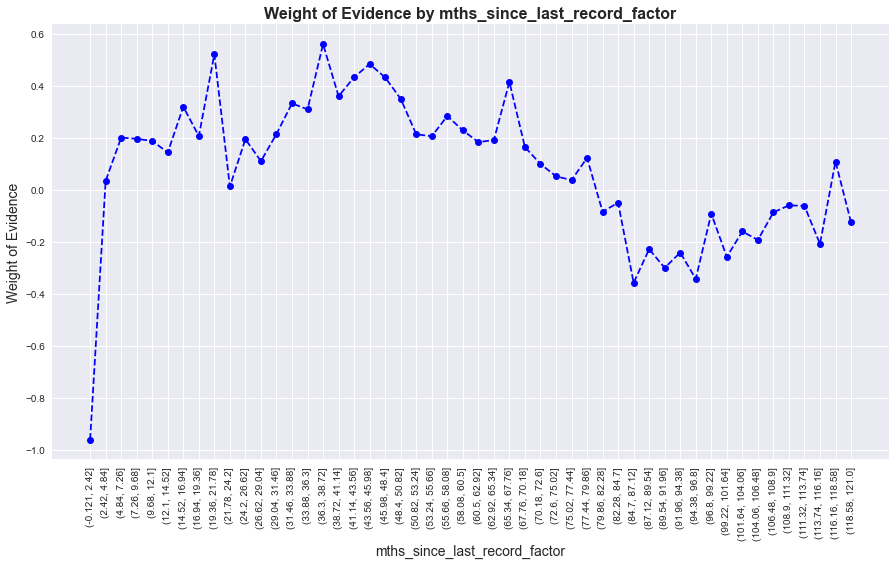

In [165]:
plot_by_woe(df_w, 90)

In [166]:
df_pre_X['mths_since_last_record:Missing'] = np.where((df_pre_X['mths_since_last_record'].isnull()), 1, 0)
df_pre_X['mths_since_last_record:0-2'] = np.where((df_pre_X['mths_since_last_record'] >= 0) & (df_pre_X['mths_since_last_record'] <= 2), 1, 0)
df_pre_X['mths_since_last_record:3-14'] = np.where((df_pre_X['mths_since_last_record'] >= 3) & (df_pre_X['mths_since_last_record'] <= 14), 1, 0)
df_pre_X['mths_since_last_record:15-21'] = np.where((df_pre_X['mths_since_last_record'] >= 15) & (df_pre_X['mths_since_last_record'] <= 21), 1, 0)
df_pre_X['mths_since_last_record:22-31'] = np.where((df_pre_X['mths_since_last_record'] >= 22) & (df_pre_X['mths_since_last_record'] <= 31), 1, 0)
df_pre_X['mths_since_last_record:32-50'] = np.where((df_pre_X['mths_since_last_record'] >= 32) & (df_pre_X['mths_since_last_record'] <= 50), 1, 0)
df_pre_X['mths_since_last_record:51-70'] =  np.where((df_pre_X['mths_since_last_record'] >= 51) & (df_pre_X['mths_since_last_record'] <= 70), 1, 0)
df_pre_X['mths_since_last_record:71-79'] = np.where((df_pre_X['mths_since_last_record'] >= 71) & (df_pre_X['mths_since_last_record'] <= 79), 1, 0)
df_pre_X['mths_since_last_record:80-84'] = np.where((df_pre_X['mths_since_last_record'] >= 80) & (df_pre_X['mths_since_last_record'] <= 84), 1, 0)
df_pre_X['mths_since_last_record:85-96'] = np.where((df_pre_X['mths_since_last_record'] >= 85) & (df_pre_X['mths_since_last_record'] <= 96), 1, 0)
df_pre_X['mths_since_last_record:>=97'] = np.where((df_pre_X['mths_since_last_record'] >= 97), 1, 0)

### Preprocessing the Test Dataset

In [167]:
# We need to create the same dummy variables for the X_test dataframe 
df_inputs_train = df_pre_X
df_targets_train = df_pre_Y

# We let df_pre_X be X_test and df_pre_Y be Y_test and rerun the code
# df_inputs_test = df_pre_X 
# df_targets_test = df_pre_Y

In [168]:
df_inputs_train.to_csv('df_inputs_train.csv')
df_targets_train.to_csv('df_targets_train.csv')

# df_inputs_test.to_csv('df_inputs_test.csv')
# df_targets_test.to_csv('df_targets_test.csv')